In [1]:
from IPython.display import display, HTML
display(HTML("""
<style>
div.container{width:85% !important;}
div.cell.code_cell.rendered{width:100%;}
div.input_prompt{padding:0px;}
div.CodeMirror {font-family:Consolas; font-size:12pt;}
div.output {font-size:12pt; font-weight:bold;}
div.input {font-family:Consolas; font-size:12pt;}
div.prompt {min-width:70px;}
div#toc-wrapper{padding-top:120px;}
div.text_cell_render ul li{font-size:12pt;padding:5px;}
table.dataframe{font-size:12px;}
</style>
"""))

# 1. import & 한글설정 & 경고메세지 ignore

In [272]:
# 패키지 import
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# 시각화의 선명도를 높임
%config InlineBackend.figure_format = "retina"

# seaborn 스타일 설정
sns.set(style='white', rc={'figure.figsize':(20,5)})

# 한글설정
plt.rc('font', family='Malgun Gothic') # 윈도우즈
plt.rc('axes', unicode_minus=False) # 축의 - 깨짐 방지


# 다른 폰트를 기본으로 하려면
# import matplotlib.font_manager as fm
# font_file = 'C:/Windows/Fonts/HMKMAMI.TTF'
# font_name = fm.FontProperties(fname=font_file,
#                              # size = 10
#                              ).get_name()
# plt.rc('font',family=font_name)
    
# warning(경고) 안보이게
import warnings
# warnings.filterwarnings(action='default')
warnings.filterwarnings(action='ignore') # 경고 메세지 무시

# 2. 서울과 부산데이터만 df 변수

In [3]:
%ls "C:/ai_x/download/shareData/상가정보_20250331/"

 C 드라이브의 볼륨에는 이름이 없습니다.
 볼륨 일련 번호: 3664-591E

 C:\ai_x\download\shareData\상가정보_20250331 디렉터리

2025-04-28  오후 03:52    <DIR>          .
2025-04-28  오후 03:52    <DIR>          ..
2025-04-27  오후 11:07             1,011 [필독]파일열람방법.txt
2025-04-27  오후 11:07        61,227,944 소상공인시장진흥공단_상가(상권)정보_강원_202503.csv
2025-04-27  오후 11:07       356,572,082 소상공인시장진흥공단_상가(상권)정보_경기_202503.csv
2025-04-27  오후 11:07        93,472,559 소상공인시장진흥공단_상가(상권)정보_경남_202503.csv
2025-04-27  오후 11:07        76,425,275 소상공인시장진흥공단_상가(상권)정보_경북_202503.csv
2025-04-27  오후 11:07        40,070,868 소상공인시장진흥공단_상가(상권)정보_광주_202503.csv
2025-04-27  오후 11:07        61,715,005 소상공인시장진흥공단_상가(상권)정보_대구_202503.csv
2025-04-27  오후 11:07        41,491,092 소상공인시장진흥공단_상가(상권)정보_대전_202503.csv
2025-04-27  오후 11:07        84,550,600 소상공인시장진흥공단_상가(상권)정보_부산_202503.csv
2025-04-27  오후 11:07       294,549,483 소상공인시장진흥공단_상가(상권)정보_서울_202503.csv
2025-04-27  오후 11:07         9,303,432 소상공인시장진흥공단_상가(상권)정보_세종_202503.csv
2025-04-27  오후 11:07        28,457,489 

In [5]:
# 서울 소상공인 데이터
df_seoul = pd.read_csv('C:/ai_x/download/shareData/상가정보_20250331/소상공인시장진흥공단_상가(상권)정보_서울_202503.csv',
                      # encoding='upf-8',
                      # sep=','
                      # low_memory=False,
                      )
df_seoul.shape

(540517, 39)

In [6]:
# 부산 소상공인 데이터
df_busan = pd.read_csv('C:/ai_x/download/shareData/상가정보_20250331/소상공인시장진흥공단_상가(상권)정보_부산_202503.csv')
df_busan.shape

(155537, 39)

In [8]:
df_seoul.columns == df_busan.columns


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [9]:
df = pd.concat( [df_seoul, df_busan])
df.shape

(696054, 39)

In [12]:
df.loc[0, ['상호명','상권업종대분류명']]

,상호명,상권업종대분류명
0,부동산임대김은숙,음식
0,경희윤한의원,보건의료


In [13]:
df.reset_index(drop=True, inplace=True)
df.loc[0,['상호명','상권업종대분류명']]

상호명         부동산임대김은숙
상권업종대분류명          음식
Name: 0, dtype: object

In [14]:
df.index

RangeIndex(start=0, stop=696054, step=1)

In [ ]:
# 현재 주피터 노트북이 쓰고 있는 메모리 용량
# pip install memory_profiler

In [15]:
%load_ext memory_profiler
%memit

peak memory: 961.27 MiB, increment: 0.07 MiB


In [17]:
def df_seoul df_busan

SyntaxError: invalid syntax (2539528362.py, line 1)

In [18]:
%load_ext memory_profiler
%memit

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler
peak memory: 961.30 MiB, increment: 0.00 MiB


# 3. df 데이터 겟의 결측치 확인 및 시각화
- missingno 라이브러리 https://github.com/ResidentMario/missingno
- matplotlib
## (0) missingno 라이브러리로 결측치 시각화
- pip install missingno

<Axes: >

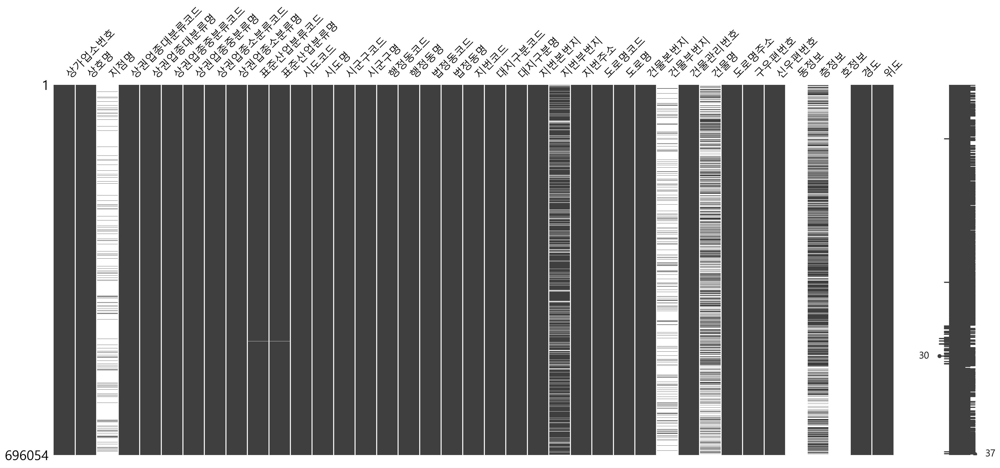

In [19]:
import missingno as msno
msno.matrix(df) # 결측치가 없는 부분은 검정색. 결측치 부분은 하얀색

<Axes: >

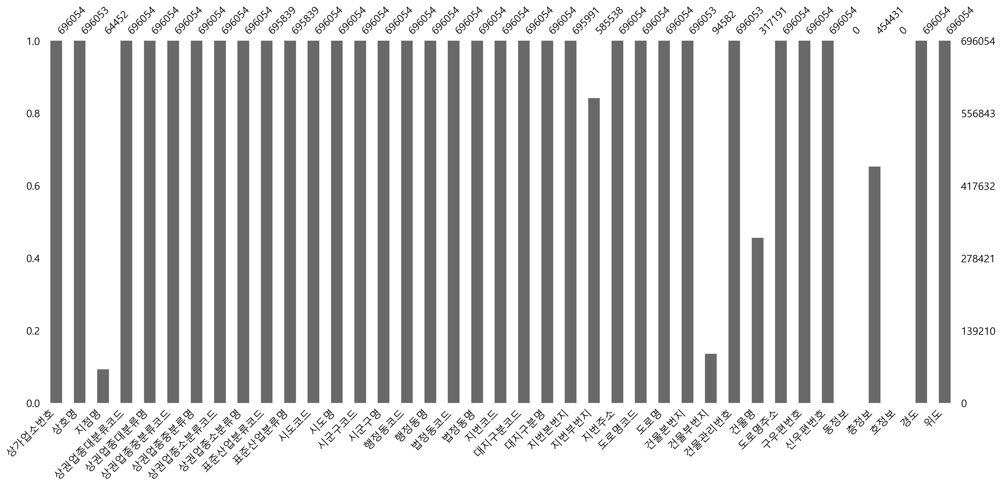

In [20]:
msno.bar(df) # 결측치가 아닌 데이터 갯수

<Axes: >

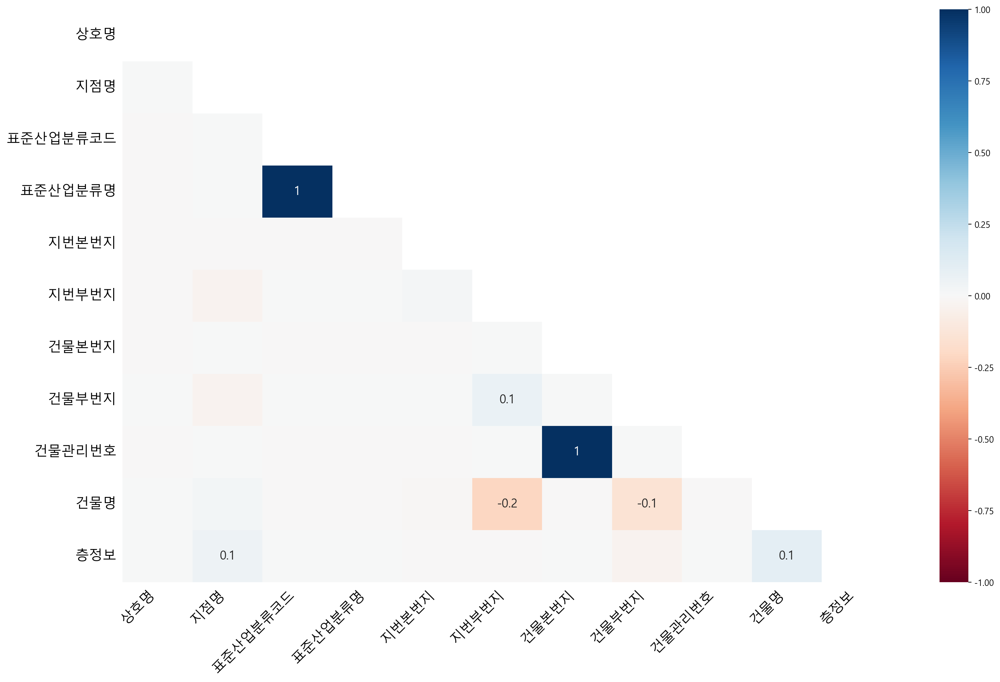

In [21]:
# 결측치가 있는 컬럼에 대해 변수별 상관관계
msno.heatmap(df)

<Axes: >

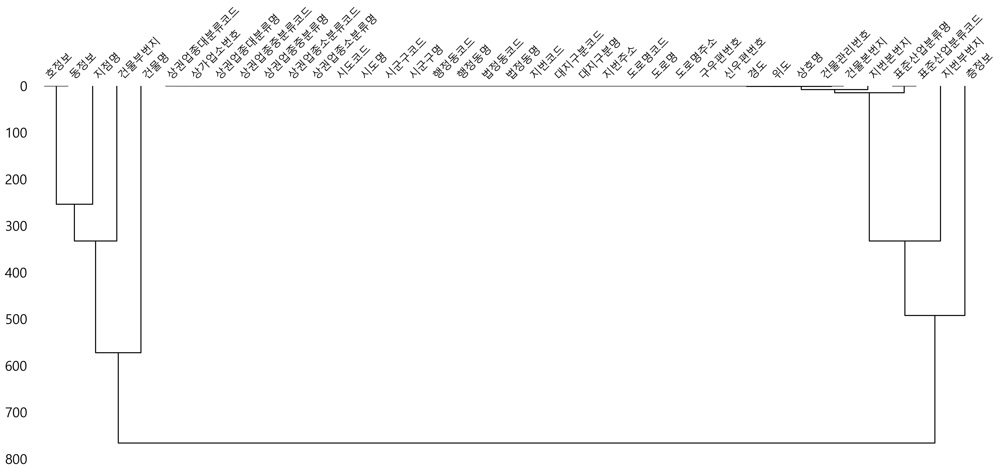

In [22]:
# 결측치가 있는 컬럼끼리 군집화
msno.dendrogram(df)

## ① df 변수의 컬럼들을 확인하고 상위 3줄, 하위 3줄을 출력한다

In [41]:
df.head(3)
df.loc[:2]
df.iloc[:3]
df.tail(3)
df.iloc[-3:]

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
696051,MA0101202502A0114732,지안영어교습소,NaN,P1,교육,P105,일반 교육,P10501,입시·교과학원,P85501,...,2635010700114850004026754,대승프라임,부산광역시 해운대구 세실로 31,612842,48111,NaN,NaN,NaN,129.179075,35.167826
696052,MA0101202502A0114738,히어로스포츠,NaN,P1,교육,P106,기타 교육,P10603,요가/필라테스 학원,P85612,...,2653010600100740025010100,NaN,부산광역시 사상구 가야대로366번길 22,617833,47006,NaN,3,NaN,129.012518,35.150000
696053,MA0101202502A0114753,안목,부산역점,I2,음식,I201,한식,I20101,백반/한정식,I56111,...,2617010100112000004006724,NaN,부산광역시 동구 중앙대로214번길 3-10,601838,48733,NaN,1,NaN,129.041453,35.116696


## ② df 변수의 결측치를 제외한 데이터 개수 및 dtype들을 출력(dtypes함수)하고 변수가 사용되는 메모리 사용량 확인한다.

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696054 entries, 0 to 696053
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     696054 non-null  object 
 1   상호명        696053 non-null  object 
 2   지점명        64452 non-null   object 
 3   상권업종대분류코드  696054 non-null  object 
 4   상권업종대분류명   696054 non-null  object 
 5   상권업종중분류코드  696054 non-null  object 
 6   상권업종중분류명   696054 non-null  object 
 7   상권업종소분류코드  696054 non-null  object 
 8   상권업종소분류명   696054 non-null  object 
 9   표준산업분류코드   695839 non-null  object 
 10  표준산업분류명    695839 non-null  object 
 11  시도코드       696054 non-null  int64  
 12  시도명        696054 non-null  object 
 13  시군구코드      696054 non-null  int64  
 14  시군구명       696054 non-null  object 
 15  행정동코드      696054 non-null  int64  
 16  행정동명       696054 non-null  object 
 17  법정동코드      696054 non-null  int64  
 18  법정동명       696054 non-null  object 
 19  지번코드       696054 non-n

## ③ 결측치를 확인하고 결측치가 없는 컬럼을 포함하여 시각화(정렬전 bar plot, barh plot, 정렬 후 bar plot, barh plot)

In [26]:
# 열별 결측치 갯수
missing_cnt = df.isnull().sum()
missing_cnt.head()

상가업소번호            0
상호명               1
지점명          631602
상권업종대분류코드         0
상권업종대분류명          0
dtype: int64

<Axes: >

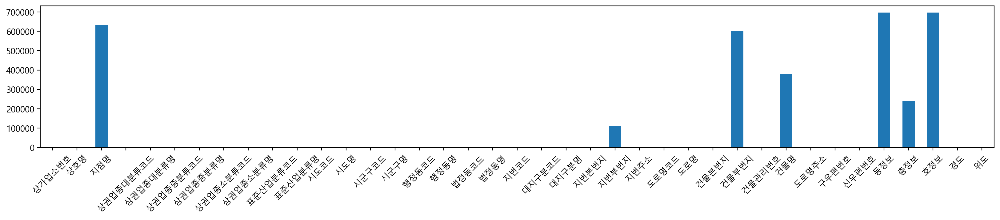

In [29]:
# missing_cnt.plot(kind='bar')
missing_cnt.plot.bar(rot=45, figsize=(20,3))

<Axes: >

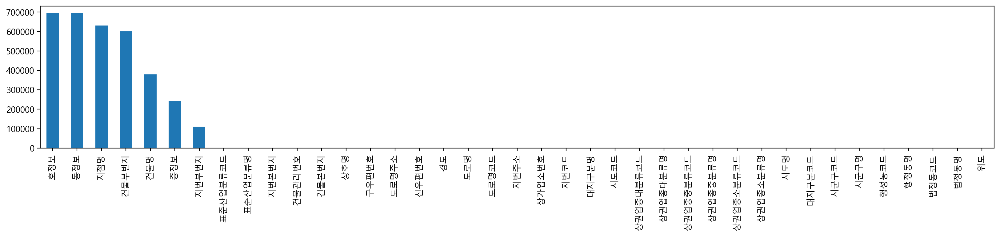

In [30]:
missing_cnt_sorted = missing_cnt.sort_values(ascending=False)
missing_cnt_sorted.plot(kind='bar', figsize=(20,3))

<Axes: >

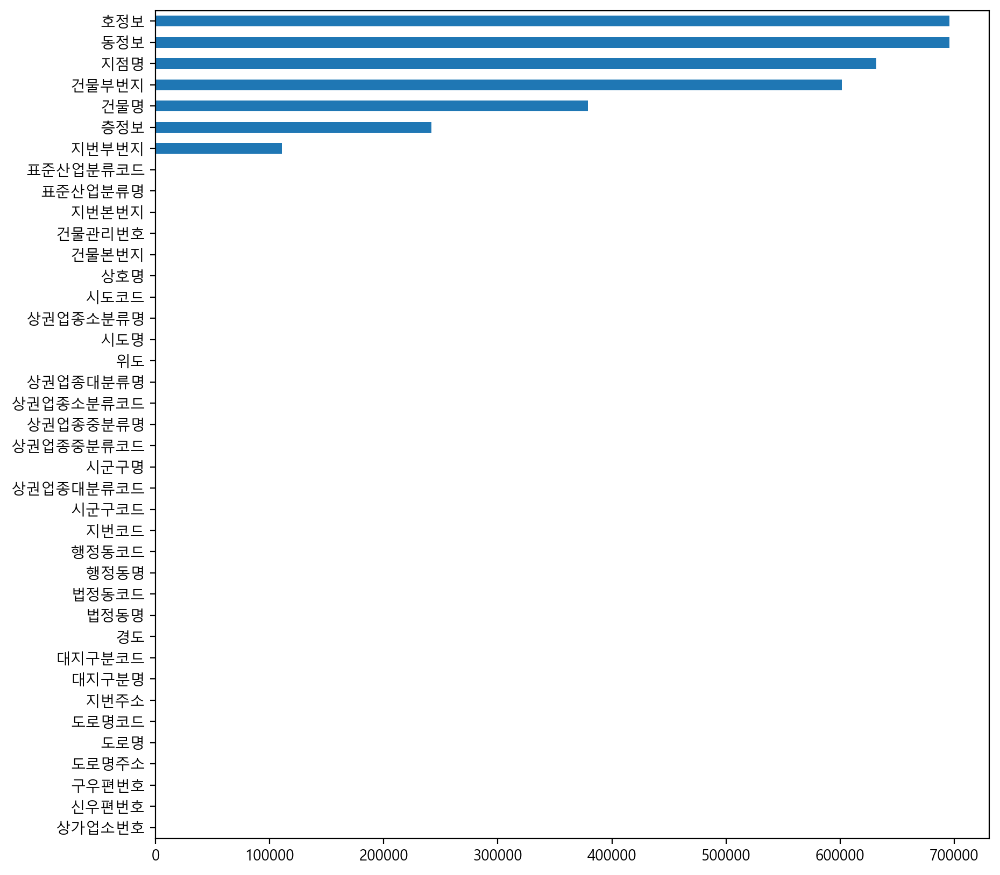

In [33]:
missing_cnt.sort_values().plot(kind='barh', figsize=(10,10))

## ④ 결측치가 없는 컬럼는 제외하고 시각화(정렬전 bar plot, barh plot, 정렬 후 bar plot, barh plot).

In [36]:
only_missing_cnt = missing_cnt[missing_cnt!=0]
only_missing_cnt

상호명              1
지점명         631602
표준산업분류코드       215
표준산업분류명        215
지번본번지           63
지번부번지       110516
건물본번지            1
건물부번지       601472
건물관리번호           1
건물명         378863
동정보         696054
층정보         241623
호정보         696054
dtype: int64

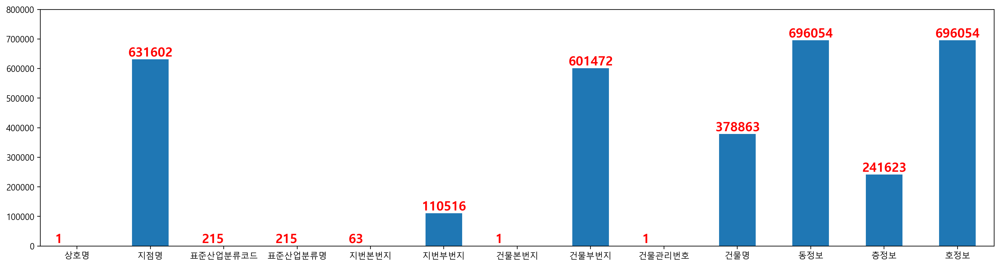

In [53]:
only_missing_cnt.plot.bar(figsize=(20,5),
                         rot=0,
                          ylim=[0, 800000])
for idx, val in enumerate(only_missing_cnt):
  plt.text(idx-0.3, val, val, size=15, color='r', weight='bold', va='bottom')
# plt.text(0, 1, 1)
# plt.text(12-0.2, 696054, 696054)

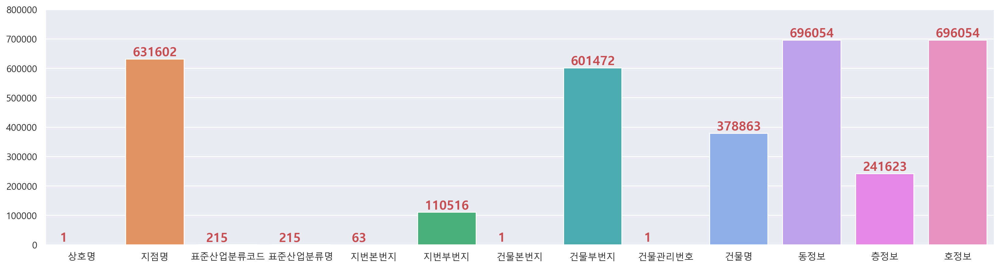

In [60]:
g = sns.barplot(x=only_missing_cnt.index,
            y=only_missing_cnt)
for idx, val in enumerate(only_missing_cnt):
  plt.text(idx-0.3, val, val, size=15, color='r', weight='bold', va='bottom')
# plt.ylim([0, 800000])
g.set_ylim([0,800000])
plt.show()

Text(0.5, 1.0, '결측치 갯수')

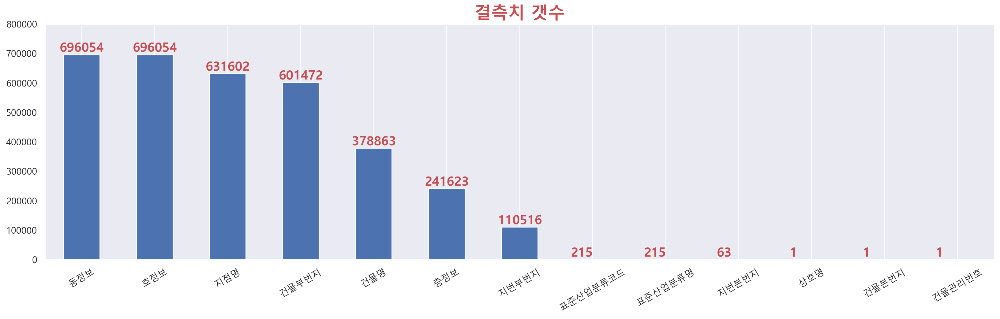

In [66]:
only_missing_cnt_sorted = only_missing_cnt.sort_values(ascending=False)
only_missing_cnt_sorted.plot.bar(rot=30,
                                ylim=[0, 800000])
for idx, val in enumerate(only_missing_cnt_sorted):
    plt.text(idx-0.3, val, val, size=15, color='r', weight='bold', 
                 va='bottom')
plt.grid(axis='y')
plt.title('결측치 갯수', color='r', fontsize=20, weight='bold')

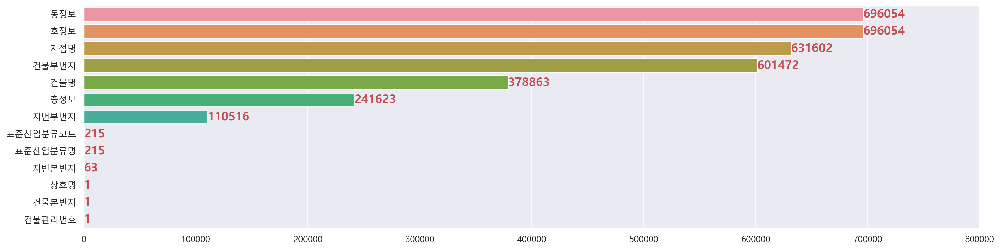

In [67]:
g = sns.barplot(y=only_missing_cnt_sorted.index, 
            x=only_missing_cnt_sorted)
for idx, val in enumerate(only_missing_cnt_sorted):
    plt.text(val, idx, val, size=15, color='r', weight='bold', 
                 va='center')
g.set_xlim([0, 800000])
plt.show()

# 4. df 데이터 셋에서 사용하지 않을 컬럼은 제거
## ① 결측치가 너무 많은 컬럼은 제거한다. 결측치가 너무 많은 상위 9개 컬럼은 제거함.


In [68]:
not_use = df.isna().sum().sort_values(ascending=False).head(9)
not_use.index

Index(['호정보', '동정보', '지점명', '건물부번지', '건물명', '층정보', '지번부번지', '표준산업분류코드',
       '표준산업분류명'],
      dtype='object')

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696054 entries, 0 to 696053
Data columns (total 39 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   상가업소번호     696054 non-null  object 
 1   상호명        696053 non-null  object 
 2   지점명        64452 non-null   object 
 3   상권업종대분류코드  696054 non-null  object 
 4   상권업종대분류명   696054 non-null  object 
 5   상권업종중분류코드  696054 non-null  object 
 6   상권업종중분류명   696054 non-null  object 
 7   상권업종소분류코드  696054 non-null  object 
 8   상권업종소분류명   696054 non-null  object 
 9   표준산업분류코드   695839 non-null  object 
 10  표준산업분류명    695839 non-null  object 
 11  시도코드       696054 non-null  int64  
 12  시도명        696054 non-null  object 
 13  시군구코드      696054 non-null  int64  
 14  시군구명       696054 non-null  object 
 15  행정동코드      696054 non-null  int64  
 16  행정동명       696054 non-null  object 
 17  법정동코드      696054 non-null  int64  
 18  법정동명       696054 non-null  object 
 19  지번코드       696054 non-n

In [72]:
# 컬럼 삭제 전 메모리 사용량 : 207.1 + MB
print('컬럼 제거전 shape :', df.shape)
df.drop(not_use.index, axis=1, inplace=True)
print('컬럼 제거후 shape :', df.shape)

컬럼 제거전 shape : (696054, 39)
컬럼 제거후 shape : (696054, 30)


## ② 컬럼명에 “코드”나 “번호”가 있는 컬럼은 분석에 사용되지 않을 예정입니다. 제거함( df.columns.str.contains(“코드|번호”) 이용).

In [74]:
cols = df.columns

In [78]:
# 코드나 번호가 포함된 컬럼명
cols[(cols.str.find('코드')!=-1) | (cols.str.find('번호')!=-1)]

Index(['상가업소번호', '상권업종대분류코드', '상권업종중분류코드', '상권업종소분류코드', '시도코드', '시군구코드',
       '행정동코드', '법정동코드', '지번코드', '대지구분코드', '도로명코드', '건물관리번호', '구우편번호',
       '신우편번호'],
      dtype='object')

In [81]:
# 코드나 번호가 포함된 컬럼명
drop_col = cols[cols.str.contains('코드|번호')]
drop_col

Index(['상가업소번호', '상권업종대분류코드', '상권업종중분류코드', '상권업종소분류코드', '시도코드', '시군구코드',
       '행정동코드', '법정동코드', '지번코드', '대지구분코드', '도로명코드', '건물관리번호', '구우편번호',
       '신우편번호'],
      dtype='object')

In [82]:
print('제거 전 shape :', df.shape)
df.drop(drop_col, axis=1, inplace=True)
print('제거 후 shape :', df.shape)

제거 전 shape : (696054, 30)
제거 후 shape : (696054, 16)


In [83]:
# 컬럼 제거 후 메모리 사용량 확인 : 207.1 -> 85
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696054 entries, 0 to 696053
Data columns (total 16 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   상호명       696053 non-null  object 
 1   상권업종대분류명  696054 non-null  object 
 2   상권업종중분류명  696054 non-null  object 
 3   상권업종소분류명  696054 non-null  object 
 4   시도명       696054 non-null  object 
 5   시군구명      696054 non-null  object 
 6   행정동명      696054 non-null  object 
 7   법정동명      696054 non-null  object 
 8   대지구분명     696054 non-null  object 
 9   지번본번지     695991 non-null  float64
 10  지번주소      696054 non-null  object 
 11  도로명       696054 non-null  object 
 12  건물본번지     696053 non-null  float64
 13  도로명주소     696054 non-null  object 
 14  경도        696054 non-null  float64
 15  위도        696054 non-null  float64
dtypes: float64(4), object(12)
memory usage: 85.0+ MB


#  ※ df 파일 io ※

In [84]:
df.to_csv("C:/ai_x/download/shareData/상가정보_20250331/서울부산상가정보(최종).csv",
         index=False)

In [3]:
df = pd.read_csv("C:/ai_x/download/shareData/상가정보_20250331/서울부산상가정보(최종).csv")

# 5. df 데이터 셋의 값을 가져온다(loc함수, iloc함수등을 사용하기도 하고 사용하지 않기도 하며 서브셋을 가져온다)
## ① 상호명 필드만 가져온다

In [86]:
df['상호명'] # 시리즈
df[['상호명']] # 데이터프레임
df.loc[:, ['상호명']]

,상호명
0,부동산임대김은숙
1,한국황토건축연구소
2,소망공인중개사사무소
3,고향집
4,보석나라
...,...
696049,포마크파티룸
696050,정옥농장
696051,지안영어교습소
696052,히어로스포츠


## ② 상호명의 종류별 데이터수를 가져온다(df.상호명.value_counts()이용)

In [87]:
df['상호명'].value_counts()

컴퓨터수리         576
입시·교과학원       351
입주청소          308
김밥천국          232
현대공인중개사사무소    195
             ... 
오오토리            1
이천산업            1
미가뷰티            1
가산문고            1
지안영어교습소         1
Name: 상호명, Length: 535747, dtype: int64

In [93]:
df.groupby('상호명')['위도'].count().sort_values(ascending=False)

상호명
컴퓨터수리                  576
입시·교과학원                351
입주청소                   308
김밥천국                   232
현대공인중개사사무소             195
                      ... 
본푸드서비스삼표점주               1
본푸드서비스본우리집밥이마트수서점        1
본푸드서비스본우리집밥본그룹본사점        1
본푸드서비스본우리집밥대치위담한방병원      1
［주］세일캠퍼스                 1
Name: 위도, Length: 535747, dtype: int64

In [91]:
# 결측치가 없는 컬럼 확인
df.isna().sum()

상호명          1
상권업종대분류명     0
상권업종중분류명     0
상권업종소분류명     0
시도명          0
시군구명         0
행정동명         0
법정동명         0
대지구분명        0
지번본번지       63
지번주소         0
도로명          0
건물본번지        1
도로명주소        0
경도           0
위도           0
dtype: int64

## ③ “상호명”과 "도로명주소” 컬럼 가져오기

In [97]:
df.loc[df.상호명=='김밥천국', ['상호명','도로명주소']]
df[ ['상호명','도로명주소']]

,상호명,도로명주소
0,부동산임대김은숙,서울특별시 종로구 삼청로 122-1
1,한국황토건축연구소,서울특별시 서초구 서초대로73길 40
2,소망공인중개사사무소,서울특별시 성동구 용답중앙15길 18
3,고향집,서울특별시 종로구 돈화문로4길 30
4,보석나라,서울특별시 구로구 개봉로3길 23
...,...,...
696049,포마크파티룸,부산광역시 부산진구 중앙대로 763-1
696050,정옥농장,부산광역시 기장군 장안읍 오리길 69-12
696051,지안영어교습소,부산광역시 해운대구 세실로 31
696052,히어로스포츠,부산광역시 사상구 가야대로366번길 22


## ④ 0~2행을 출력하라 (head()함수를 이용하지 않고, loc과 iloc을 이용)

In [98]:
df.loc[0:2]
df.iloc[0:3]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,대지구분명,지번본번지,지번주소,도로명,건물본번지,도로명주소,경도,위도
0,부동산임대김은숙,음식,비알코올,카페,서울특별시,종로구,삼청동,삼청동,대지,28.0,서울특별시 종로구 삼청동 28-21,서울특별시 종로구 삼청로,122.0,서울특별시 종로구 삼청로 122-1,126.981840,37.586250
1,한국황토건축연구소,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,서초구,서초4동,서초동,대지,1308.0,서울특별시 서초구 서초동 1308-25,서울특별시 서초구 서초대로73길,40.0,서울특별시 서초구 서초대로73길 40,127.024563,37.500924
2,소망공인중개사사무소,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,성동구,용답동,용답동,대지,4.0,서울특별시 성동구 용답동 4-11,서울특별시 성동구 용답중앙15길,18.0,서울특별시 성동구 용답중앙15길 18,127.054262,37.564786


# 6. 기술 통계값 보기 

- [Descriptive statistics - Wikipedia](https://en.wikipedia.org/wiki/Descriptive_statistics)
- [Computations / descriptive stats](https://pandas.pydata.org/docs/reference/frame.html#computations-descriptive-stats)
- [표준 편차 - 위키백과, 우리 모두의 백과사전](https://ko.wikipedia.org/wiki/표준편차)
* describe()를 사용하면 데이터 요약을 볼 수 있음(기술통계량)
    - 기본적으로 수치형 데이터를 요약
    - include, exclude 옵션으로 다른 데이터 타입의 요약 수치 출력
    - count, min, max, mean, median, 1사분위수, 3사분위수

### **개별 기술 통계값 구하기**

* [Computations / descriptive stats](https://pandas.pydata.org/docs/reference/frame.html#computations-descriptive-stats)
* count : 결측치를 제외한 값 갯수
* min, max: 최솟값, 최댓값
* argmin, argmax : 최솟값 인덱스, 최댓값 인덱스 반환
* quantile 특정 사분위수에 해당하는 값을 반환 (0~1 사이)
    * 0.25 : 1사분위 수
    * 0.5 : 2사분위수 (quantile 의 기본 값)
    * 0.75 : 3사분위수
* sum 수치 데이터의 합계
* mean 평균
* median 중앙값(중간값:데이터를 한 줄로 세웠을 때 가운데 위치하는 값, 중앙값이 짝수일 때는 가운데 2개 값의 평균을 구함)

* std, var 표준편차, 분산을 계산
* cumsum 맨 첫 번째 성분부터 각 성분까지의 누적합을 계산 (0 번째 부터 계속 더해짐)
* cumprod 맨 첫번째 성분부터 각 성분까지의 누적곱을 계산 (1 번째 부터 계속 곱해짐)
* cov, corr() : 공분산, 상관계수
* skew 왜도 (오른쪽으로 치우침= 왜도<0, 왼쪽으로 치우침=왜도>0)
* kurt 첨도
## ① df 데이터셋의 요약기술 통계량

In [100]:
df.describe() # 수치형 컬럼에 대한 기술통계량

,지번본번지,건물본번지,경도,위도
count,695991.000000,696053.000000,696054.000000,696054.000000
mean,480.607357,143.589911,127.455853,37.009921
std,512.914069,263.204012,0.866655,0.990450
min,1.000000,1.000000,126.768186,34.989747
25%,111.000000,19.000000,126.943200,37.474714
50%,335.000000,47.000000,127.034361,37.514521
75%,684.000000,152.000000,127.130725,37.560269
max,6435.000000,3646.000000,129.292220,37.692604


In [102]:
df.describe(include='object') # object형에 대한 기술 통계량 : 최빈값, 최빈값갯수, 데이터종류갯수, 데이터갯수

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,대지구분명,지번주소,도로명,도로명주소
count,696053,696054,696054,696054,696054,696054,696054,696054,696054,696054,696054,696054
unique,535747,10,75,247,2,39,628,647,2,220969,18864,223665
top,컴퓨터수리,음식,한식,백반/한정식,서울특별시,강남구,역삼1동,서초동,대지,서울특별시 송파구 문정동 634,서울특별시 강남구 테헤란로,서울특별시 송파구 충민로 66
freq,576,193508,71670,34283,540517,64716,13655,18140,695225,938,4462,1200


In [103]:
df.describe(exclude='object') # object형을 제외한 기술통계량

,지번본번지,건물본번지,경도,위도
count,695991.000000,696053.000000,696054.000000,696054.000000
mean,480.607357,143.589911,127.455853,37.009921
std,512.914069,263.204012,0.866655,0.990450
min,1.000000,1.000000,126.768186,34.989747
25%,111.000000,19.000000,126.943200,37.474714
50%,335.000000,47.000000,127.034361,37.514521
75%,684.000000,152.000000,127.130725,37.560269
max,6435.000000,3646.000000,129.292220,37.692604


In [105]:
# object형의 기술 통계량 df.describe(include='object')
# object형 데이터
df.select_dtypes('object').head()

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,대지구분명,지번주소,도로명,도로명주소
0,부동산임대김은숙,음식,비알코올,카페,서울특별시,종로구,삼청동,삼청동,대지,서울특별시 종로구 삼청동 28-21,서울특별시 종로구 삼청로,서울특별시 종로구 삼청로 122-1
1,한국황토건축연구소,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,서초구,서초4동,서초동,대지,서울특별시 서초구 서초동 1308-25,서울특별시 서초구 서초대로73길,서울특별시 서초구 서초대로73길 40
2,소망공인중개사사무소,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,성동구,용답동,용답동,대지,서울특별시 성동구 용답동 4-11,서울특별시 성동구 용답중앙15길,서울특별시 성동구 용답중앙15길 18
3,고향집,음식,한식,백반/한정식,서울특별시,종로구,종로1.2.3.4가동,장사동,대지,서울특별시 종로구 장사동 80,서울특별시 종로구 돈화문로4길,서울특별시 종로구 돈화문로4길 30
4,보석나라,소매,시계·귀금속 소매,시계/귀금속 소매업,서울특별시,구로구,개봉3동,개봉동,대지,서울특별시 구로구 개봉동 359-8,서울특별시 구로구 개봉로3길,서울특별시 구로구 개봉로3길 23


## ② df 데이터셋의 “지번본번지", "건물본번지” 컬럼의 데이터 개수와  dtype 메모리 사용량을 확인한다.

In [106]:
df[['지번본번지','건물본번지']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696054 entries, 0 to 696053
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   지번본번지   695991 non-null  float64
 1   건물본번지   696053 non-null  float64
dtypes: float64(2)
memory usage: 10.6 MB


## ③ “위도", "경도” 컬럼만의 요약 기술통계량

In [108]:
# 두 컬럼의 타입
df[['위도','경도']].dtypes

위도    float64
경도    float64
dtype: object

In [109]:
df[['위도','경도']].describe()

,위도,경도
count,696054.000000,696054.000000
mean,37.009921,127.455853
std,0.990450,0.866655
min,34.989747,126.768186
25%,37.474714,126.943200
50%,37.514521,127.034361
75%,37.560269,127.130725
max,37.692604,129.292220


# 7. 단변량 수치형 변수 시각화
## ① 위도의 빈도표를 시각화 : plot.hist, hist, sns.displot, sns.histplot


<Axes: ylabel='Frequency'>

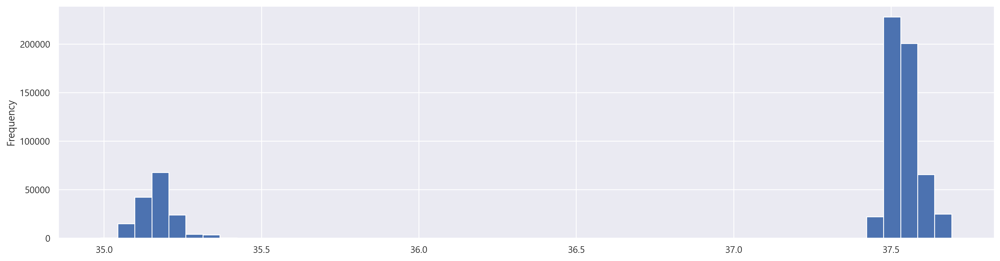

In [113]:
df['위도'].plot.hist(bins=50)

<Axes: >

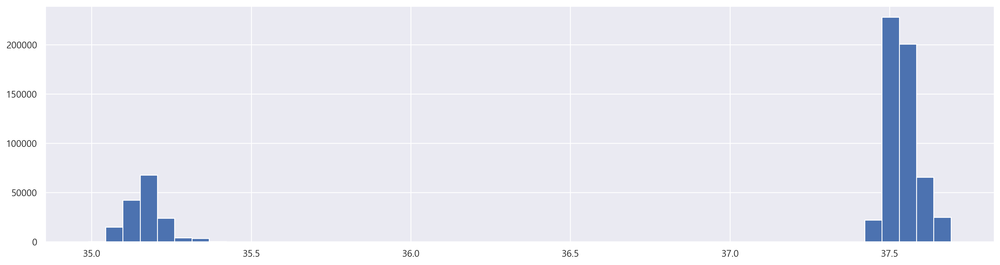

In [114]:
df['위도'].hist(bins=50)

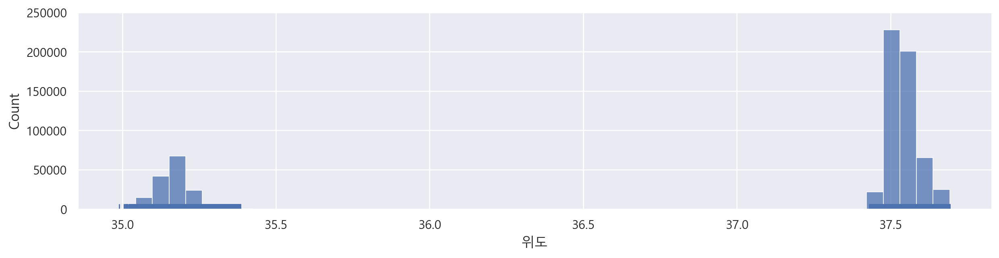

In [115]:
g = sns.displot(data=df, x='위도', bins=50, rug=True)
g.fig.set_size_inches(15,3)

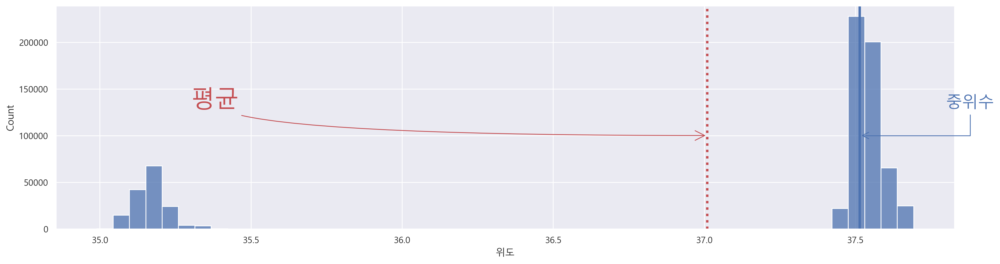

In [135]:
sns.histplot(data=df, x='위도', bins=50)
plt.axvline(df['위도'].mean(), color='r', linestyle=':', linewidth='3')
plt.annotate('평균',
            xytext=(35.3,130000), # 글자 좌표
            xy = (df['위도'].mean(), 100000), # 화살표가 가르킬 좌표
            arrowprops=dict(arrowstyle='->',
                           connectionstyle='angle3',
                           color='r'),
            fontsize=30,
            color='r'
            )
plt.axvline(df['위도'].median(), color='b', linewidth=3)
plt.annotate('중위수',
            xytext=(37.8,130000), # 글자 좌표
            xy = (df['위도'].median(), 100000), # 화살표가 가르킬 좌표
            arrowprops={'arrowstyle':'->',
                           'connectionstyle':'angle',
                           'color':'b'},
            fontsize=20,
            color='b'
            )
plt.show()

In [120]:
# 왜도 : 평균을 기준으로 치우친 정도
# 오른쪽으로 치우침 : 왜도가 음수. 평균<중위수
# 왼쪽으로 치우침 : 왜도가 양수. 중위수<평균
df['위도'].skew()

-1.3235077358631402

## ② 경도의 빈도표를 시각화 : plot.hist, hist, sns.displot, sns.histplot

Text(126.7, 120000, '중위수')

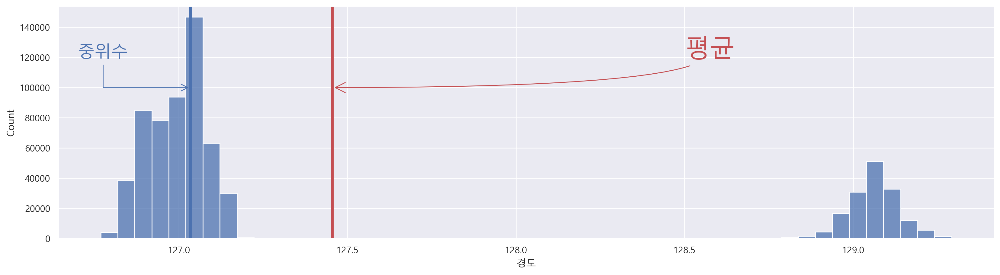

In [132]:
sns.histplot(data=df, x='경도', bins=50)
plt.axvline(df.경도.mean(), color='r', linewidth=3)
plt.annotate('평균',
            xytext=(128.5,120000), # 글자 좌표
            xy = (df['경도'].mean(), 100000), # 화살표가 가르킬 좌표
            arrowprops=dict(arrowstyle='->',
                           connectionstyle='angle3',
                           color='r'),
            fontsize=30,
            color='r'
            )
plt.axvline(df.경도.median(), color='b', linewidth=3)
plt.annotate('중위수',
            xytext=(126.7,120000), # 글자 좌표
            xy = (df['경도'].median(), 100000), # 화살표가 가르킬 좌표
            arrowprops=dict(arrowstyle='->',
                           connectionstyle='angle',
                           color='b'),
            fontsize=20,
            color='b'
            )

In [124]:
df.경도.skew()

1.3076255398048455

# 8. 상관계수
-  두 변수 간에 어떤 선형적 관계를 갖고 있는 지를 분석하는 방법
- [상관 분석 - 위키백과, 우리 모두의 백과사전M](https://ko.wikipedia.org/wiki/상관_분석) 

- 결과의 해석 : r 값은 X 와 Y 가 완전히 동일하면 +1, 전혀 다르면 0, 반대방향으로 완전히 동일 하면 –1 을 가진다. 결정계수(coefficient of determination)는 $r^2$로 계산하며 이것은 X 로부터 Y를 예측할 수 있는 정도를 의미한다.
- ([수학기호 사이트 참조](https://matplotlib.org/2.0.2/users/mathtext.html))

- 일반적으로
    * r이 -1.0과 -0.7 사이이면, 강한 음적 선형관계,
    * r이 -0.7과 -0.3 사이이면, 뚜렷한 음적 선형관계,
    * r이 -0.3과 -0.1 사이이면, 약한 음적 선형관계,
    * r이 -0.1과 +0.1 사이이면, 거의 무시될 수 있는 선형관계,
    * r이 +0.1과 +0.3 사이이면, 약한 양적 선형관계,
    * r이 +0.3과 +0.7 사이이면, 뚜렷한 양적 선형관계,
    * r이 +0.7과 +1.0 사이이면, 강한 양적 선형관계로 해석한다.

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/d/d4/Correlation_examples2.svg/220px-Correlation_examples2.svg.png" width="600">

이미지 출처 : [위키백과](https://ko.wikipedia.org/wiki/상관_분석)
## ① 전체 숫자 컬럼끼리의 상관계수

In [138]:
corr = df.corr(numeric_only=True)
corr

,지번본번지,건물본번지,경도,위도
지번본번지,1.000000,0.057312,0.169355,-0.189570
건물본번지,0.057312,1.000000,-0.005815,0.012164
경도,0.169355,-0.005815,1.000000,-0.993565
위도,-0.189570,0.012164,-0.993565,1.000000


## ② 상관계수를 이용하여 heatmap 시각화
참조 http://seaborn.pydata.org/examples/many_pairwise_correlations.html


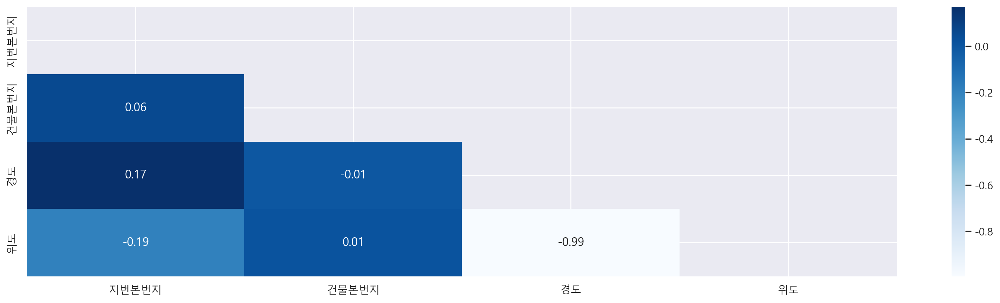

In [140]:
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='Blues', mask=mask)
plt.show()

In [147]:
a = np.array([[2.0, 1, 3],
              [1, 1, 3],
              [3, 3, 3]]) # 2행 2열 짜리 배열
np.ones( (2, 2), dtype=bool) # 매개변수에 온 구조의 배열에 1로

array([[ True,  True],
       [ True,  True]])

In [148]:
np.ones_like(a) # a변수와 구조가 같은 배열에 1로

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [150]:
temp = np.ones_like(corr, dtype=bool) # corr변수와 구조가 같은 배열에 1
temp

array([[ True,  True,  True,  True],
       [ True,  True,  True,  True],
       [ True,  True,  True,  True],
       [ True,  True,  True,  True]])

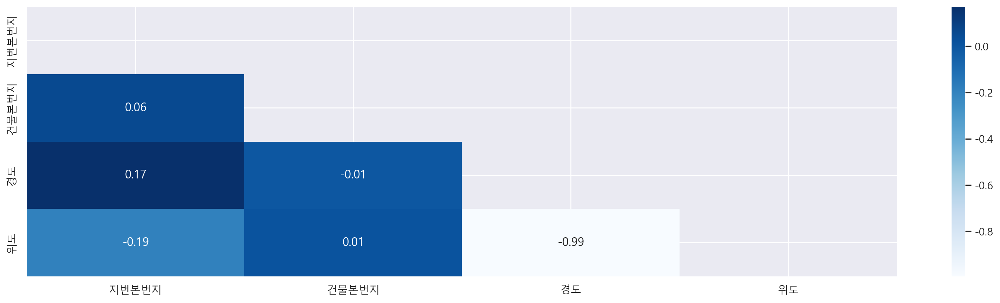

In [155]:
mask = np.triu(np.ones_like(corr, dtype=bool), k=0) # k=0 기본값
sns.heatmap(corr, annot=True, fmt='.2f', cmap='Blues', mask=mask)
plt.show()

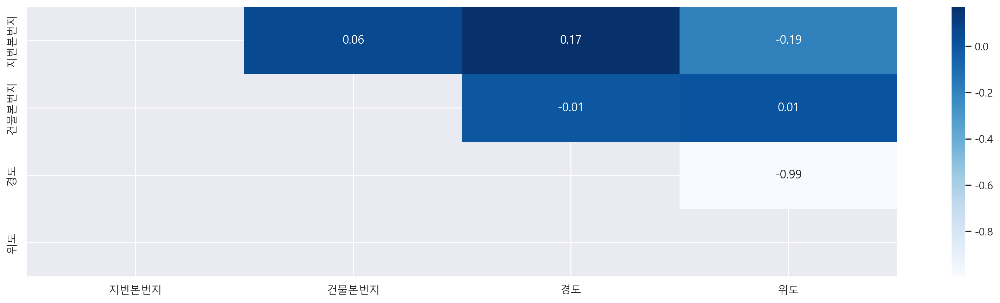

In [157]:
mask = np.triu(np.ones_like(corr, dtype=bool), k=1) # k=0 기본값
sns.heatmap(corr, annot=True, fmt='.2f', cmap='Blues', mask=~mask)
plt.show()

# 9. 경도와 위도 컬럼을 이용하여 산점도
Anscombe’s quartet — seaborn 0.10.0 documentation
https://seaborn.pydata.org/examples/anscombes_quartet.html
## ① X축에는 경도, y축에는 위도 컬럼을 산점도로 시각화


In [6]:
df.shape

(696054, 16)

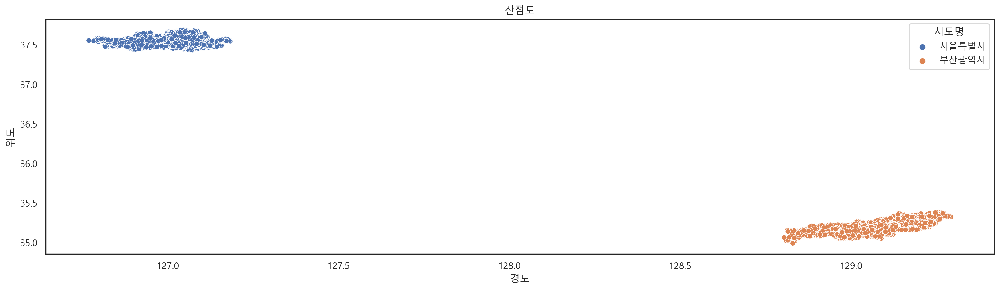

CPU times: total: 20.9 s
Wall time: 21.5 s


In [8]:
%%time
# 산점도의 경우 시간이 많이 걸리면 sample 데이터로
g = sns.scatterplot(data=df, x='경도', y='위도', hue='시도명')
# g.set_title('산점도', color='r', fontsize=12)
g.set(title = '산점도')
# plt.title('산점도',color='r', fontsize=12)
plt.show()

## ② 경도와 위도의 산점도를 “시도명” 컬럼별로 서브플롯으로 시각화

In [14]:
df['시도명'].unique()

array(['서울특별시', '부산광역시'], dtype=object)

In [ ]:
# df 전체 데이터 수
df.shape[0], len(df)

In [13]:
# 원본 데이터의 시도명별 비중
cnt = df['시도명'].value_counts()
cnt/len(df)*100

서울특별시    77.654464
부산광역시    22.345536
Name: 시도명, dtype: float64

In [22]:
# 단순 샘플링 데이터의 시도명별 비중
df_sample = df.sample(frac=0.1)
cnt = df_sample['시도명'].value_counts()
cnt/len(df_sample)*100

서울특별시    77.692694
부산광역시    22.307306
Name: 시도명, dtype: float64

In [28]:
# 층화 샘플링 데이터의 시도명별 비중
from sklearn.model_selection import train_test_split
_, df_sample = train_test_split(df,
                               test_size=0.1,
                               # train_size=0.9,
                               stratify=df.시도명)
cnt = df_sample['시도명'].value_counts()
cnt/len(df_sample)*100

서울특별시    77.654225
부산광역시    22.345775
Name: 시도명, dtype: float64

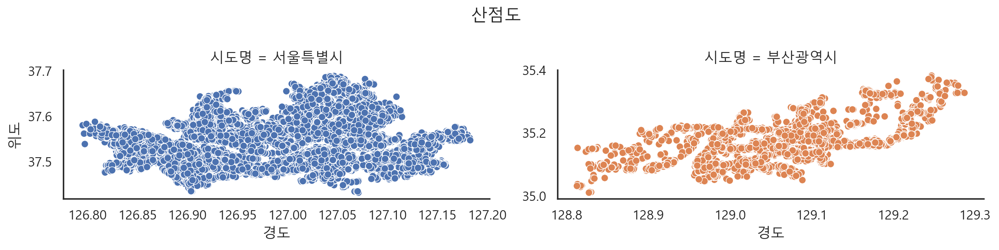

In [35]:
g = sns.relplot(data=df_sample,
           x='경도', y='위도',
           hue='시도명',
           col='시도명', # 서브플롯을 그리는 기준 열
           facet_kws={'sharex':False, 'sharey':False}, # 축 공유
           legend=False, # 범례 안보이게
           height=3, # 높이
           aspect=2, # 높이에 대한 가로 사이즈 비율
           )
# g.fig.set_size_inches(16, 8)
g.fig.suptitle('산점도')
plt.tight_layout() # 여백 거의 없이 겹침 방지
plt.show()

## ③ 위의 1번에서 시각화된 산점도를 바탕으로 회귀선을 그린다.

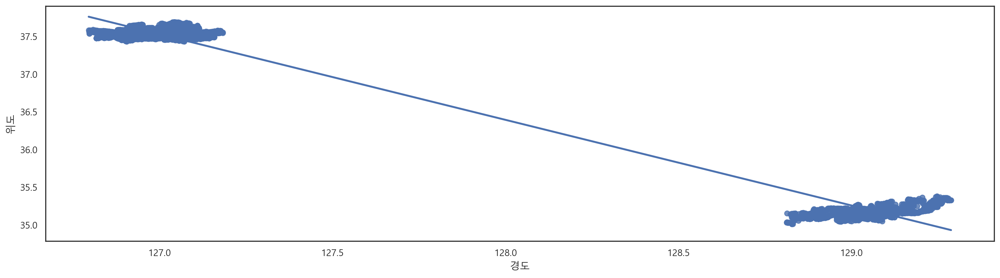

In [36]:
sns.regplot(data=df_sample, x='경도', y='위도')
plt.show()

## ④ 위의 2번에서 시각화된 산점도를 바탕으로 회귀선을 서브 플롯으로 그린다.

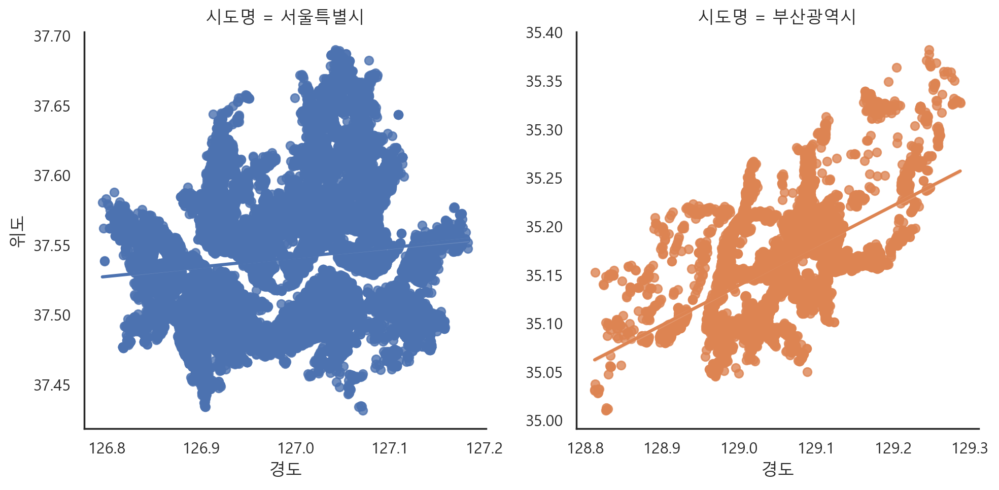

In [40]:
sns.lmplot(data=df_sample, x='경도', y='위도',
           hue='시도명',
           col='시도명',
           facet_kws={'sharex':False, 'sharey':False})
plt.show()

# 10. 상권업종대분류명별 상호명의 개수를 도출하고 시각화하기

In [41]:
df['상권업종대분류명'].value_counts()

음식         193508
소매         151969
과학·기술      107216
수리·개인       71012
교육          52404
부동산         30940
시설관리·임대     30466
예술·스포츠      26408
보건의료        20758
숙박          11373
Name: 상권업종대분류명, dtype: int64

In [42]:
df.isna().sum()

상호명          1
상권업종대분류명     0
상권업종중분류명     0
상권업종소분류명     0
시도명          0
시군구명         0
행정동명         0
법정동명         0
대지구분명        0
지번본번지       63
지번주소         0
도로명          0
건물본번지        1
도로명주소        0
경도           0
위도           0
dtype: int64

In [44]:
# 상호명이 결측치인 행
df[df['상호명'].isna()]

,상호명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,대지구분명,지번본번지,지번주소,도로명,건물본번지,도로명주소,경도,위도
548763,NaN,소매,섬유·의복·신발 소매,신발 소매업,부산광역시,부산진구,부전2동,부전동,대지,573.0,부산광역시 부산진구 부전동 573-1,부산광역시 부산진구 중앙대로,717.0,부산광역시 부산진구 중앙대로 717,129.059138,35.155237


In [51]:
# 상권업종대분류명별 상호명수 (pivot_table은 2차원, groupby 1차원이거나 2차원)
result = df.pivot_table(index='상권업종대분류명',
              values='상호명',
              aggfunc='count').sort_values(by='상호명', ascending=False)
# result.columns = ['상호수']
result.rename(columns={'상호명':'상호수'}, inplace=True)
result.head(2)

,상호수
상권업종대분류명,
음식,193508
소매,151968


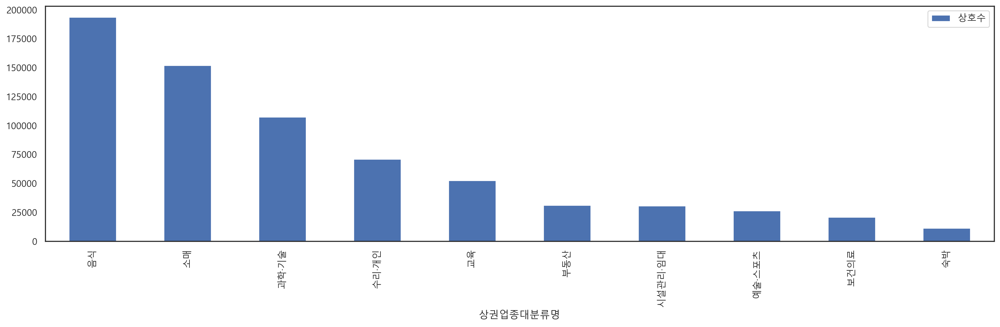

In [52]:
result.plot.bar()
plt.show()

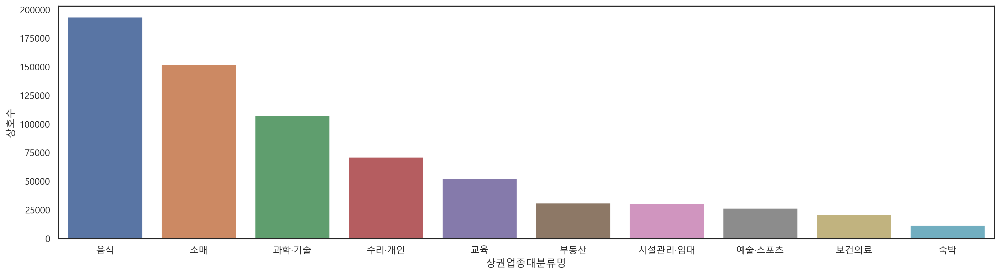

In [56]:
sns.barplot(data=result.reset_index(),
           x='상권업종대분류명',
           y='상호수')
plt.show()

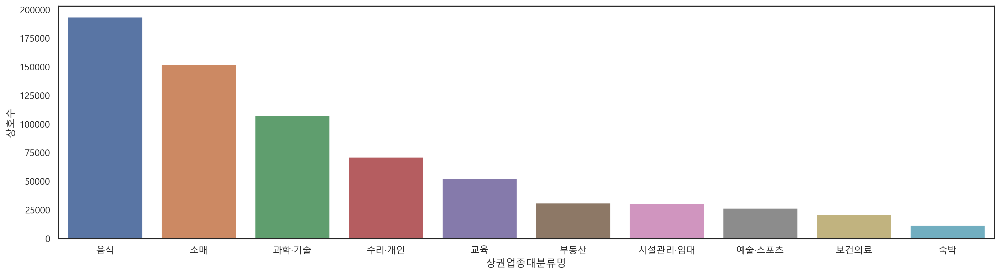

In [57]:
sns.barplot(data=result,
           x=result.index,
           y='상호수')
plt.show()

In [62]:
group = df.groupby(['상권업종대분류명', '상권업종중분류명', '상권업종소분류명'])
len(group)
for grp, val in group:
    print(grp)

('과학·기술', '광고', '광고 대행업')
('과학·기술', '광고', '광고 매체 판매업')
('과학·기술', '광고', '광고물 설계/제작업')
('과학·기술', '광고', '기타 광고 관련 서비스업')
('과학·기술', '광고', '옥외/전시 광고 대행업')
('과학·기술', '기술 서비스', '건물 및 토목 엔지니어링 서비스업')
('과학·기술', '기술 서비스', '건축 설계 및 관련 서비스업')
('과학·기술', '기술 서비스', '기타 엔지니어링 서비스업')
('과학·기술', '기술 서비스', '도시 계획 및 조경 설계 서비스업')
('과학·기술', '기술 서비스', '환경 관련 엔지니어링 서비스업')
('과학·기술', '기타 전문 과학', '번역/통역 서비스업')
('과학·기술', '기타 전문 과학', '사업/무형 재산권 중개업')
('과학·기술', '법무관련 ', '공인노무사')
('과학·기술', '법무관련 ', '기타 법무관련 서비스업')
('과학·기술', '법무관련 ', '법무사')
('과학·기술', '법무관련 ', '변리사')
('과학·기술', '법무관련 ', '변호사')
('과학·기술', '법무관련 ', '행정사')
('과학·기술', '본사·경영 컨설팅', '경영 컨설팅업')
('과학·기술', '사진 촬영', '사진촬영업')
('과학·기술', '수의', '동물병원')
('과학·기술', '시장 조사', '시장 조사 및 여론 조사업')
('과학·기술', '인쇄·제품제작', '명함/간판/광고물 제작')
('과학·기술', '전문 디자인', '시각 디자인업')
('과학·기술', '전문 디자인', '인테리어 디자인업')
('과학·기술', '전문 디자인', '제품 디자인업')
('과학·기술', '전문 디자인', '패션/섬유/기타 전문 디자인업')
('과학·기술', '회계·세무', '공인회계사')
('과학·기술', '회계·세무', '기타 회계 관련 서비스업')
('과학·기술', '회계·세무', '세무사')
('교육', '교육 지원', '교육컨설팅업

# 11. 상권업종대분류명이 음식인 서브셋을 이용한 분석
## ① “상권업종대분류명”이 음식인 서브셋을 변수 df_food에 할당하고 확인


In [68]:
df_food = df[df['상권업종대분류명']=='음식']
df_food.shape

(193508, 16)

In [71]:
df_food.groupby('시군구명')['상호명'].count().sort_values(ascending=False)

시군구명
강남구     12608
강서구      9814
마포구      9328
중구       8426
송파구      8289
영등포구     7793
부산진구     6811
서초구      6738
종로구      6641
관악구      5786
해운대구     5316
용산구      5137
강동구      5034
광진구      5023
구로구      4772
동대문구     4758
은평구      4625
성북구      4618
성동구      4595
노원구      4452
중랑구      4261
서대문구     4233
동래구      4164
사하구      4133
동작구      3867
양천구      3856
강북구      3787
금천구      3722
수영구      3601
금정구      3587
남구       3250
연제구      3222
기장군      3198
사상구      3171
북구       3039
도봉구      2841
동구       1866
영도구      1639
서구       1507
Name: 상호명, dtype: int64

# ②	“상권업종대분류명”이 음식이면서, "시군구명”이 강남구 데이터만 가져와 “상권업종중분류명”별로 빈도수를 구함(loc함수를 이용 vs loc함수 이용안함)

In [74]:
# loc함수 이용안함
df_food[df_food['시군구명']=='강남구']['상권업종중분류명'].value_counts()

한식         4329
비알코올       2180
기타 간이      2083
주점         1292
서양식        1037
일식          915
중식          445
동남아시아       201
구내식당·뷔페     125
기타 외국         1
Name: 상권업종중분류명, dtype: int64

In [75]:
# loc함수 이용
df_food.loc[df_food['시군구명']=='강남구','상권업종중분류명'].value_counts()

한식         4329
비알코올       2180
기타 간이      2083
주점         1292
서양식        1037
일식          915
중식          445
동남아시아       201
구내식당·뷔페     125
기타 외국         1
Name: 상권업종중분류명, dtype: int64

In [80]:
df_kangmam = df_food.loc[df_food['시군구명']=='강남구']
# 1차원
df_kangmam.groupby('상권업종중분류명')['상호명'].count().sort_values(ascending=False)
# 2차원
df_kangmam.groupby('상권업종중분류명')[['상호명']].count().sort_values(
                                                            by='상호명',
                                                            ascending=False)
df_kangmam.groupby('상권업종중분류명',
                   as_index=False)['상호명'].count().sort_values(
                                                            by='상호명',
                                                            ascending=False)
df_kangmam.pivot_table(index='상권업종중분류명',
                      values='상호명',
                      aggfunc='count').sort_values(by='상호명',
                                                   ascending=False)

,상호명
상권업종중분류명,
한식,4329
비알코올,2180
기타 간이,2083
주점,1292
서양식,1037
일식,915
중식,445
동남아시아,201
구내식당·뷔페,125


# 12. df 데이터셋에서 “상권업종대분류명”이 음식인 데이터 중 서울특별시 데이터 서브셋
https://seaborn.pydata.org/tutorial/categorical.html : 범주형그래프
## ① “상권업종대분류명”이 음식인 서브셋 중 서울특별시 데이터만 변수 df_seoul_food에 할당하고 확인


In [82]:
df_seoul_food = df[(df['상권업종대분류명']=='음식') & (df['시도명']=='서울특별시')]
df_seoul_food.shape

(139929, 16)

## ② df_seoul_food 데이터 셋을 시군구명, 상권업종중분류명으로 그룹화하여 상점수를 count한 내용을 food_gu 변수에 할당. 

In [85]:
food_gu = df_seoul_food.groupby(['시군구명','상권업종중분류명'])['상호명'].count()
# food_gu = df_seoul_food.pivot_table(index['시군구명','상권업종중분류명'],
#                                     values='상호명',
#                                     aggfunc='count')
food_gu

시군구명  상권업종중분류명
강남구   구내식당·뷔페      125
      기타 간이       2083
      기타 외국          1
      동남아시아        201
      비알코올        2180
                  ... 
중랑구   서양식           87
      일식           140
      주점           632
      중식           113
      한식          1804
Name: 상호명, Length: 240, dtype: int64

## ③ food_gu 변수를 다음과 같은 스타일의 표로 출력(food_gu 이용).

In [86]:
food_gu.unstack()

상권업종중분류명,구내식당·뷔페,기타 간이,기타 외국,동남아시아,비알코올,서양식,일식,주점,중식,한식
시군구명,,,,,,,,,,
강남구,125.0,2083.0,1.0,201.0,2180.0,1037.0,915.0,1292.0,445.0,4329.0
강동구,36.0,1176.0,1.0,61.0,750.0,145.0,225.0,642.0,162.0,1836.0
강북구,20.0,758.0,NaN,23.0,493.0,104.0,115.0,602.0,109.0,1563.0
강서구,66.0,1584.0,3.0,74.0,1067.0,207.0,329.0,921.0,262.0,2528.0
관악구,20.0,1224.0,1.0,52.0,795.0,199.0,257.0,934.0,234.0,2070.0
광진구,28.0,1025.0,NaN,57.0,809.0,187.0,248.0,677.0,235.0,1757.0
구로구,39.0,991.0,4.0,46.0,658.0,92.0,170.0,635.0,336.0,1801.0
금천구,61.0,764.0,5.0,40.0,579.0,66.0,129.0,459.0,211.0,1408.0
노원구,34.0,1136.0,NaN,40.0,691.0,155.0,201.0,465.0,163.0,1567.0


## 

## ④ 위 3번 스타일의 표를 pivot_table함수를 이용하여 출력

In [87]:
df_seoul_food.pivot_table(index='시군구명',
                         columns='상권업종중분류명',
                         values='상호명',
                         aggfunc='count')

상권업종중분류명,구내식당·뷔페,기타 간이,기타 외국,동남아시아,비알코올,서양식,일식,주점,중식,한식
시군구명,,,,,,,,,,
강남구,125.0,2083.0,1.0,201.0,2180.0,1037.0,915.0,1292.0,445.0,4329.0
강동구,36.0,1176.0,1.0,61.0,750.0,145.0,225.0,642.0,162.0,1836.0
강북구,20.0,758.0,NaN,23.0,493.0,104.0,115.0,602.0,109.0,1563.0
강서구,66.0,1584.0,3.0,74.0,1067.0,207.0,329.0,921.0,262.0,2528.0
관악구,20.0,1224.0,1.0,52.0,795.0,199.0,257.0,934.0,234.0,2070.0
광진구,28.0,1025.0,NaN,57.0,809.0,187.0,248.0,677.0,235.0,1757.0
구로구,39.0,991.0,4.0,46.0,658.0,92.0,170.0,635.0,336.0,1801.0
금천구,61.0,764.0,5.0,40.0,579.0,66.0,129.0,459.0,211.0,1408.0
노원구,34.0,1136.0,NaN,40.0,691.0,155.0,201.0,465.0,163.0,1567.0


## ⑤ 3번의 결과 중 강남구 데이터만 뽑아 barplot으로 시각화(판다스 plot이용)

<Axes: xlabel='시군구명'>

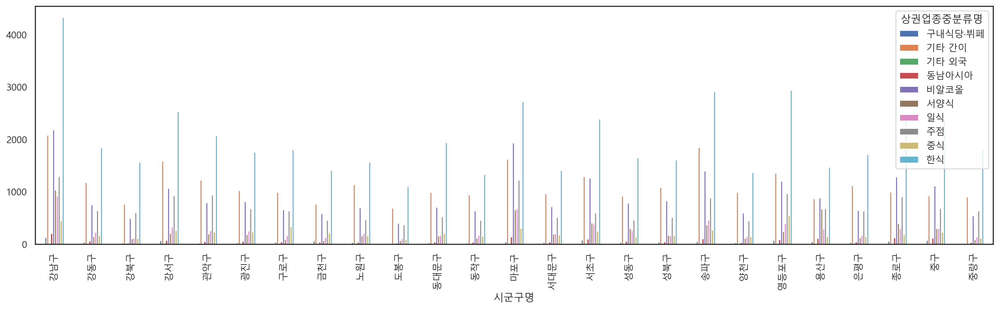

In [88]:
food_gu.unstack().plot.bar(figsize=(20,5))

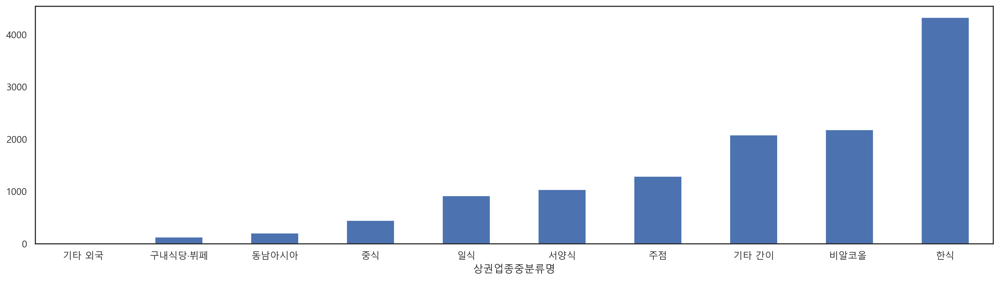

In [92]:
food_gu['강남구'].sort_values().plot.bar(rot=0)
plt.show()

## ⑥ 3번 food_gu를 seaborn을 이용하여 구별 음식점 상호 개수를 시각화

In [95]:
food_gu_resetidx = food_gu.reset_index()
food_gu_resetidx.head()

,시군구명,상권업종중분류명,상호명
0,강남구,구내식당·뷔페,125
1,강남구,기타 간이,2083
2,강남구,기타 외국,1
3,강남구,동남아시아,201
4,강남구,비알코올,2180


In [108]:
food_gu_resetidx.rename(columns={'상호명':'상호수'}, inplace=True)
food_gu_resetidx.iloc[:20:5]

,시군구명,상권업종중분류명,상호수
0,강남구,구내식당·뷔페,125
5,강남구,서양식,1037
10,강동구,구내식당·뷔페,36
15,강동구,서양식,145


<Axes: xlabel='시군구명', ylabel='상호수'>

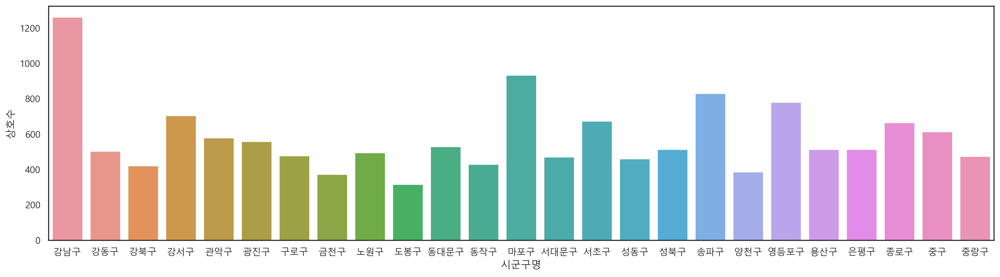

In [109]:
sns.barplot(data=food_gu_resetidx,
           x='시군구명',
           y='상호수',
           errorbar=None,
           # estimator='sum'
           )

## ⑦ 상권업종중분류명별 음식점 상호갯수

<Axes: xlabel='상권업종중분류명', ylabel='상호수'>

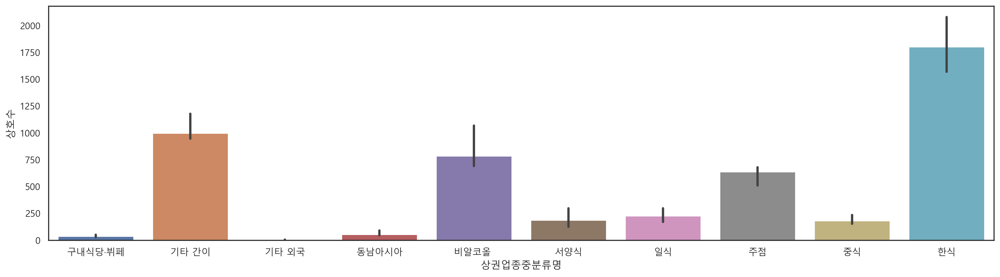

In [111]:
sns.barplot(data=food_gu_resetidx,
           x='상권업종중분류명',
           y='상호수',
           estimator=np.median)

## ⑧ Seaborn의 catplot을 이용하여 상권업종중분류별 음식점을 구별로 상권업종중분류명별 bar차트를 서브플롯으로 시각화

In [113]:
food_gu_resetidx.sample()

,시군구명,상권업종중분류명,상호수
165,송파구,동남아시아,106


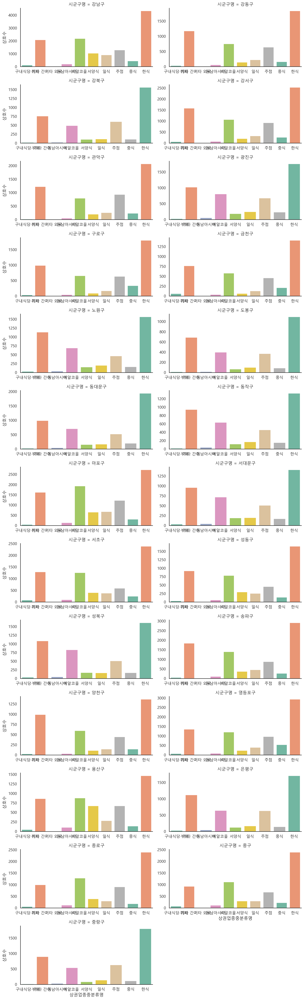

In [121]:
sns.catplot(data=food_gu_resetidx,
           x='상권업종중분류명', y='상호수',
           kind='bar',
           col='시군구명',
           palette='Set2', # color map
           col_wrap=2, # 한줄에 그려질 서브플롯수
           height=3, # 높이
           aspect=2, # 높이 대비 가로 비율
           sharex=False, sharey=False) # 축공유 여부
plt.show()

## ⑨ Seaborn의 catplot을 이용하여 구별 음식점을 상권업종중분류명별로 서브 플롯으로 시각화

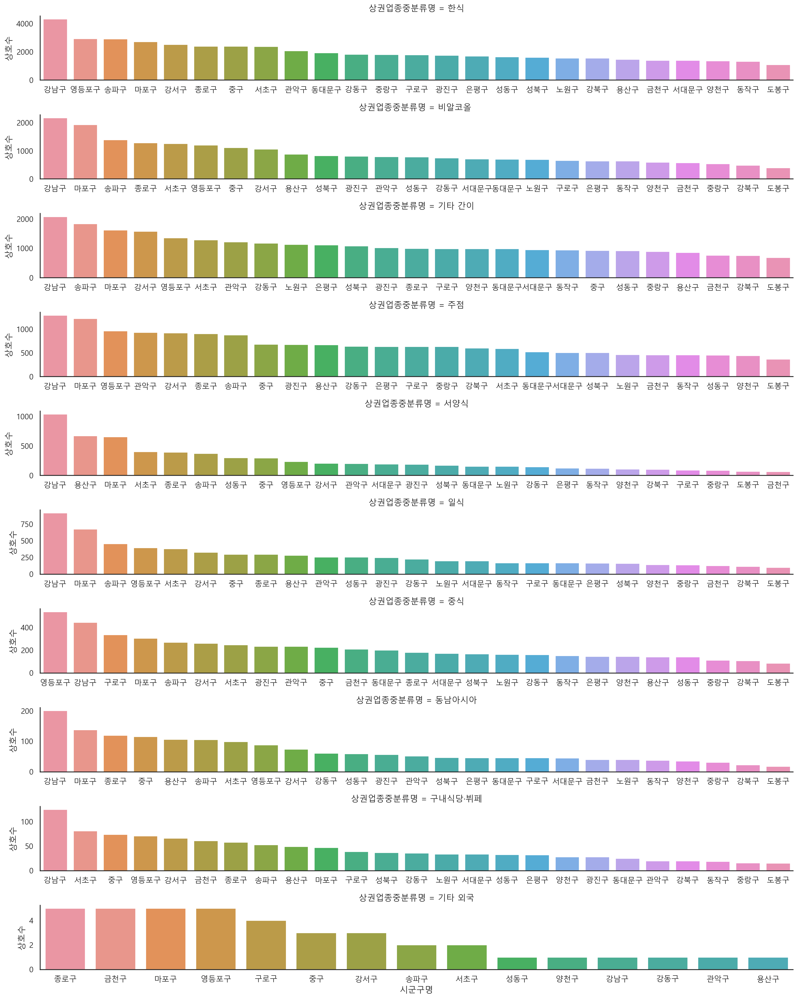

In [127]:
sns.catplot(data=food_gu_resetidx.sort_values(by='상호수', ascending=False),
           x='시군구명', y='상호수',
           kind='bar',
           col='상권업종중분류명',
           col_wrap=1,
           sharex=False, sharey=False,
           height=2,
           aspect=8)
plt.show()

In [126]:
food_gu_resetidx.sort_values(by='상호수', ascending=False)

,시군구명,상권업종중분류명,상호수
9,강남구,한식,4329
191,영등포구,한식,2934
171,송파구,한식,2913
123,마포구,한식,2725
38,강서구,한식,2528
...,...,...,...
174,양천구,기타 외국,1
2,강남구,기타 외국,1
12,강동구,기타 외국,1
41,관악구,기타 외국,1


# 13. 구별로 학원수 비교 : 서울 대치동이나 목동에 사교육이 발달되었다는 가설을 뒷받침할 수 있는 분석
## ① 서울시 교육(상권업종대분류명 이용) 데이터를 df_academy 변수에 할당하고 확인


In [128]:
df['상권업종대분류명'].unique()

array(['음식', '부동산', '소매', '수리·개인', '과학·기술', '예술·스포츠', '시설관리·임대', '교육',
       '숙박', '보건의료'], dtype=object)

In [131]:
df_academy = df[(df['상권업종대분류명']=='교육') & (df['시도명']=='서울특별시')]
df_academy.shape

(44627, 16)

## ② df_academy 데이터 셋을 상호명별로 빈도수 출력(value_counts()함수 이용하거나 groupby이용)

In [132]:
df_academy['상호명'].value_counts()

입시·교과학원        337
음악학원            20
한우리독서토론논술       15
예리엘잉글리쉬         14
모던필라테스          14
              ... 
쭈야공간             1
빌리프필라테스          1
시티테니스            1
휴먼파크역량개발평가원      1
아이니코미술교습소        1
Name: 상호명, Length: 41310, dtype: int64

In [134]:
df_academy.groupby('상호명')['위도'].count().sort_values(ascending=False)

상호명
입시·교과학원              337
음악학원                  20
한우리독서토론논술             15
예리엘잉글리쉬               14
개인과외                  14
                    ... 
비에스입시컨설팅진학상담지도교습소      1
비에스티                   1
비에이발레학원                1
비에이블펜싱클럽               1
［주］세일캠퍼스               1
Name: 위도, Length: 41310, dtype: int64

## ③ df_academy 데이터 셋을 상호명별로 빈도수 상위 10개 출력

In [137]:
df_academy['상호명'].value_counts().head(10)
df_academy['상호명'].value_counts().iloc[:10]

입시·교과학원      337
음악학원          20
한우리독서토론논술     15
예리엘잉글리쉬       14
모던필라테스        14
개인과외          14
아메리카요가        13
더블유에스복싱클럽     11
외국어학원         11
용인대태권도        10
Name: 상호명, dtype: int64

## ④ df_academy 데이터 셋을 시군구명 별로 빈도수 출력(학원이 가장 많은 구부터 출력)

In [138]:
df_academy['시군구명'].value_counts()

강남구     6191
서초구     3808
송파구     3116
마포구     2611
양천구     2398
강서구     2263
노원구     1983
강동구     1943
영등포구    1794
성북구     1582
은평구     1573
관악구     1563
광진구     1391
서대문구    1328
동작구     1324
구로구     1298
동대문구    1196
성동구     1187
종로구     1090
중랑구      975
도봉구      935
용산구      878
금천구      815
강북구      804
중구       581
Name: 시군구명, dtype: int64

<Axes: >

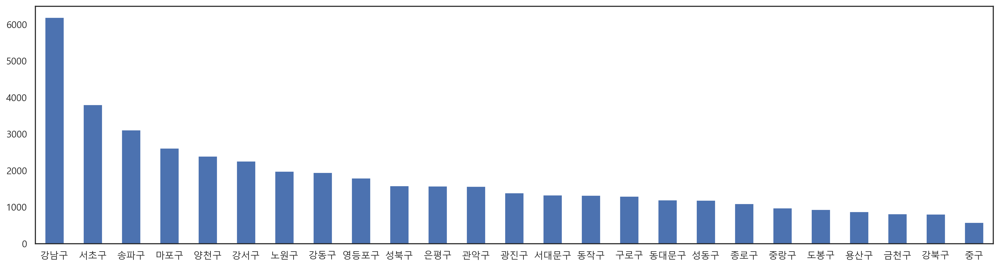

In [140]:
df_academy['시군구명'].value_counts().plot.bar(rot=0)

<Axes: ylabel='시군구명'>

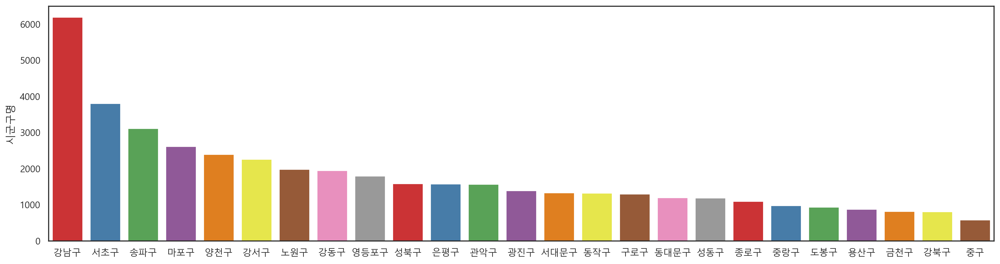

In [141]:
result = df_academy['시군구명'].value_counts()
sns.barplot(x=result.index, y=result, palette='Set1')

## ⑤ df_academy 데이터 셋에서 어떤 종류의 학원들이 많은지 상위 10개만 academy_count변수에 할당하고 출력(상권업종소분류명 컬럼 이용)

In [142]:
df_academy['상권업종중분류명'].unique()

array(['기타 교육', '교육 지원', '일반 교육'], dtype=object)

In [143]:
df_academy['상권업종소분류명'].unique() # 상권업종소분류명 데이터 종류

array(['레크리에이션 교육기관', '기타 교육지원 서비스업', '태권도/무술학원', '요가/필라테스 학원', '직원 훈련기관',
       '사회교육시설', '입시·교과학원', '기타 기술/직업 훈련학원', '교육컨설팅업', '컴퓨터 학원', '외국어학원',
       '기타 예술/스포츠 교육기관', '미술학원', '청소년 수련시설', '그 외 기타 교육기관', '음악학원',
       '전문자격/고시학원', '운전학원'], dtype=object)

In [145]:
df_academy['상권업종소분류명'].nunique() # 상권업종소분류명 데이터 종류수

18

In [149]:
academy_count = df_academy['상권업종소분류명'].value_counts().head(10)
academy_count

입시·교과학원          15901
요가/필라테스 학원        5113
음악학원              3827
기타 기술/직업 훈련학원     3079
기타 교육지원 서비스업      2760
미술학원              2466
태권도/무술학원          2263
그 외 기타 교육기관       2020
교육컨설팅업            1833
외국어학원             1327
Name: 상권업종소분류명, dtype: int64

## ⑥ df_academy 데이터셋에서 상권업종소분류명별로 빈도수를 구했을 때 빈도가 1500이상인 데이터만 따로 academy_count_1500변수에 할당

In [153]:
academy_count_1500 = academy_count[academy_count>1500]
academy_count_1500.index

Index(['입시·교과학원', '요가/필라테스 학원', '음악학원', '기타 기술/직업 훈련학원', '기타 교육지원 서비스업',
       '미술학원', '태권도/무술학원', '그 외 기타 교육기관', '교육컨설팅업'],
      dtype='object')

In [155]:
# df_academy에서 소분류가 academy_count_1500인 데이터
top1500 = df_academy[df_academy['상권업종소분류명'].isin(academy_count_1500.index)]
top1500.shape

(39262, 16)

<Axes: >

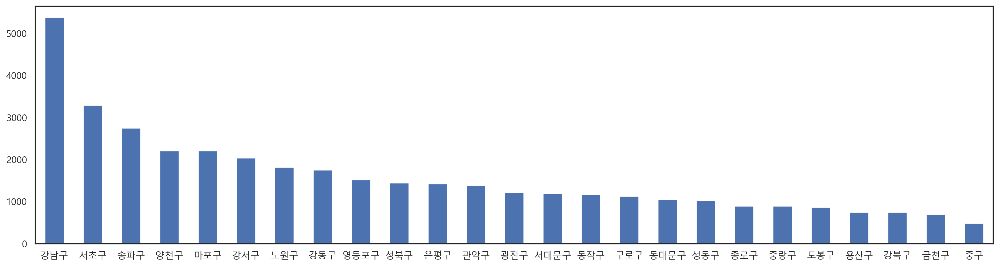

In [159]:
top1500['시군구명'].value_counts()
top1500['시군구명'].value_counts().plot.bar(rot=0)

## ⑦ df_academy 데이터셋을 “시군구명”, "상권업종소분류명” 별 상호명 빈도수를 academy_group 변수에 할당 출력

In [165]:
academy_group = df_academy.groupby(['시군구명', '상권업종소분류명'])['상호명'].count()
academy_group.unstack().head(2)

상권업종소분류명,교육컨설팅업,그 외 기타 교육기관,기타 교육지원 서비스업,기타 기술/직업 훈련학원,기타 예술/스포츠 교육기관,레크리에이션 교육기관,미술학원,사회교육시설,외국어학원,요가/필라테스 학원,운전학원,음악학원,입시·교과학원,전문자격/고시학원,직원 훈련기관,청소년 수련시설,컴퓨터 학원,태권도/무술학원
시군구명,,,,,,,,,,,,,,,,,,
강남구,483.0,300.0,647.0,350.0,173.0,93.0,301.0,28.0,258.0,730.0,12.0,286.0,2136.0,38.0,145.0,6.0,59.0,146.0
강동구,35.0,63.0,49.0,90.0,51.0,39.0,130.0,5.0,58.0,204.0,4.0,197.0,855.0,8.0,13.0,4.0,8.0,130.0


## ⑧ academy_group 데이터셋에서 강남구 데이터만 출력 및 시각화(barplot)

In [167]:
academy_group['강남구'].sort_values(ascending=False)

상권업종소분류명
입시·교과학원           2136
요가/필라테스 학원         730
기타 교육지원 서비스업       647
교육컨설팅업             483
기타 기술/직업 훈련학원      350
미술학원               301
그 외 기타 교육기관        300
음악학원               286
외국어학원              258
기타 예술/스포츠 교육기관     173
태권도/무술학원           146
직원 훈련기관            145
레크리에이션 교육기관         93
컴퓨터 학원              59
전문자격/고시학원           38
사회교육시설              28
운전학원                12
청소년 수련시설             6
Name: 상호명, dtype: int64

<Axes: xlabel='상권업종소분류명'>

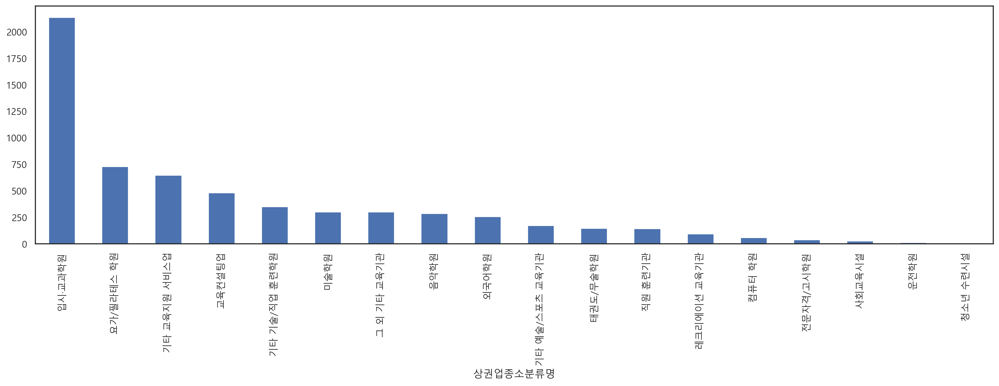

In [175]:
result = academy_group['강남구'].sort_values(ascending=False)
result.plot.bar()
result.plot(kind='bar')

<Axes: xlabel='상권업종소분류명', ylabel='상호명'>

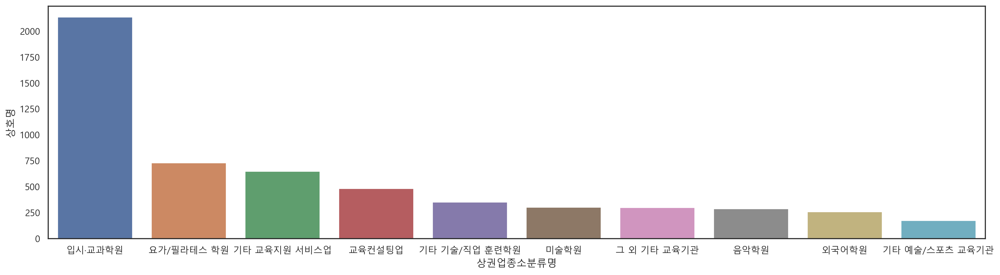

In [176]:
sns.barplot(x=result.head(10).index,
           y=result.head(10))

## ⑨ df_academy데이터 중 “법정동명”컬럼이 “대치동”과 “목동”인 데이터만 가져와 상권업종소분류명별 빈도수 출력

In [178]:
df_academy.loc[df_academy['법정동명']=='대치동','상권업종소분류명'].value_counts()

입시·교과학원           1202
교육컨설팅업             132
미술학원                98
요가/필라테스 학원          97
기타 교육지원 서비스업        80
외국어학원               51
그 외 기타 교육기관         44
음악학원                32
태권도/무술학원            22
기타 기술/직업 훈련학원       20
전문자격/고시학원           15
컴퓨터 학원              13
기타 예술/스포츠 교육기관      12
직원 훈련기관             12
레크리에이션 교육기관         11
사회교육시설               8
운전학원                 4
청소년 수련시설             1
Name: 상권업종소분류명, dtype: int64

In [179]:
df_academy.loc[df_academy['법정동명']=='목동','상권업종소분류명'].value_counts()

입시·교과학원           682
요가/필라테스 학원         95
음악학원               70
미술학원               52
태권도/무술학원           39
기타 기술/직업 훈련학원      33
교육컨설팅업             27
기타 예술/스포츠 교육기관     22
기타 교육지원 서비스업       19
그 외 기타 교육기관        19
외국어학원              18
레크리에이션 교육기관        13
직원 훈련기관             6
컴퓨터 학원              5
운전학원                3
사회교육시설              3
청소년 수련시설            2
Name: 상권업종소분류명, dtype: int64

In [187]:
# 대치동이나 목동이 포함한 면목동도 들어옴
# df_academy[df_academy['법정동명'].str.contains('대치동|목동')] x

# (df_academy['법정동명']=='대치동') | (df_academy['법정동명']=='목동')
top5 = df_academy.loc[df_academy['법정동명'].isin(['대치동','목동']),
          '상권업종소분류명'].value_counts().head(6)
top5 = top5.drop('요가/필라테스 학원')
top5 # 대치동과 목동에 많은 입시관련 소분류명

입시·교과학원         1884
교육컨설팅업           159
미술학원             150
음악학원             102
기타 교육지원 서비스업      99
Name: 상권업종소분류명, dtype: int64

In [190]:
# df_academy의 소분류명이 top5인 데이터
df_academy_sel = df_academy[df_academy['상권업종소분류명'].isin(top5.index)]

In [192]:
# 입시관련 법정동명 count
df_academy_sel['법정동명'].value_counts().head(15)

대치동    1544
서초동     882
목동      850
신정동     686
역삼동     652
중계동     652
신사동     528
봉천동     483
상계동     462
방배동     450
반포동     396
신림동     393
명일동     357
화곡동     350
마곡동     287
Name: 법정동명, dtype: int64

## ⑩ “상권업종소분류명”별 "시군구명” 별 상호명 빈도수를 g변수에 할당하고 출력

In [197]:
g = df_academy.groupby(['상권업종소분류명','시군구명'])['상호명'].count()
# g = df_academy.groupby(['시군구명','상권업종소분류명'])['상호명'].count()
# g['관악구']
g

상권업종소분류명  시군구명
교육컨설팅업    강남구     483
          강동구      35
          강북구      19
          강서구      62
          관악구      54
                 ... 
태권도/무술학원  용산구      34
          은평구     101
          종로구      30
          중구       20
          중랑구      73
Name: 상호명, Length: 444, dtype: int64

## ⑪ g변수의 내용중 "상권업종소분류명” 컬럼이 “입시·교과학원”데이터만 시각화(pandas의 plot.bar, pandas의 barh, seaborn의 barplot)

In [203]:
result = g['입시·교과학원'].sort_values(ascending=False)
result.head(3)

시군구명
강남구    2136
양천구    1330
송파구    1149
Name: 상호명, dtype: int64

<Axes: xlabel='시군구명'>

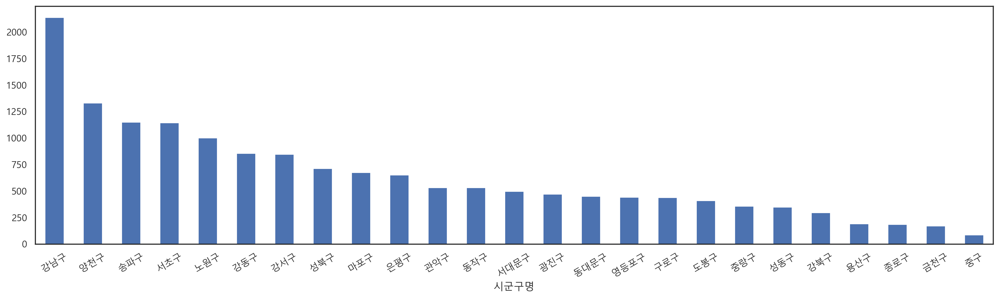

In [204]:
result.plot.bar(rot=30)

<Axes: ylabel='시군구명'>

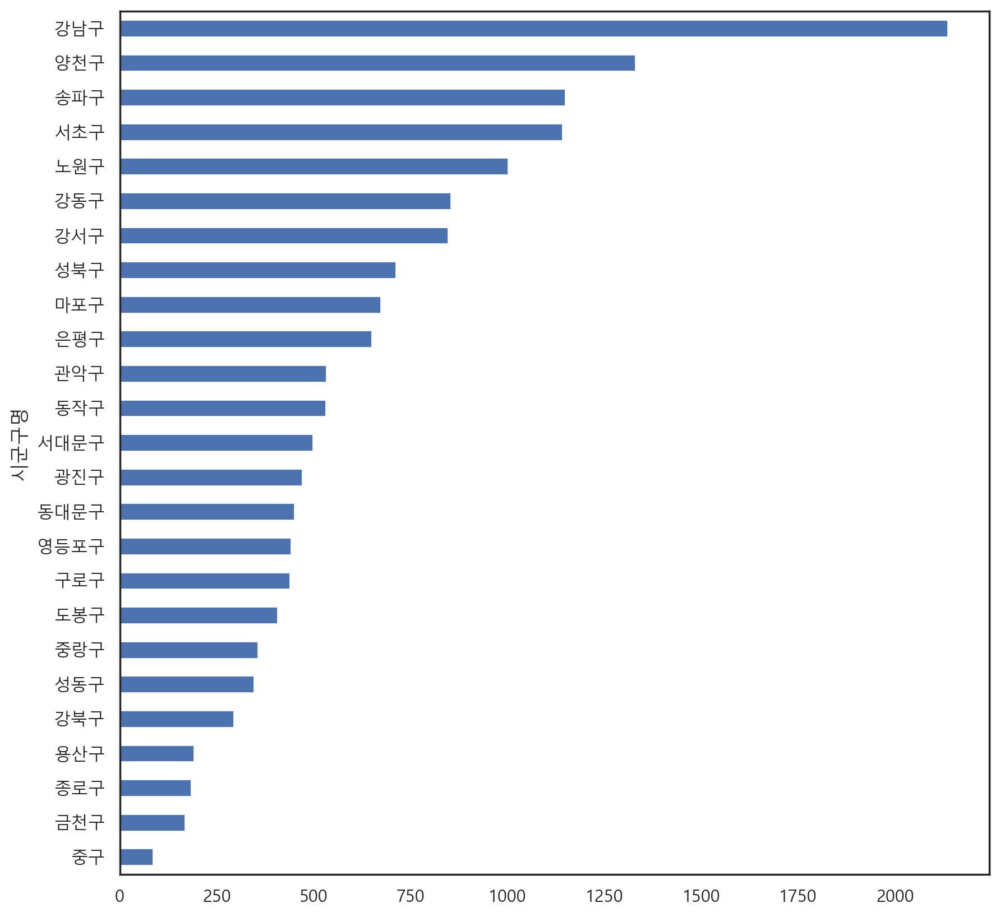

In [208]:
result.sort_values().plot.barh(figsize=(10,10))

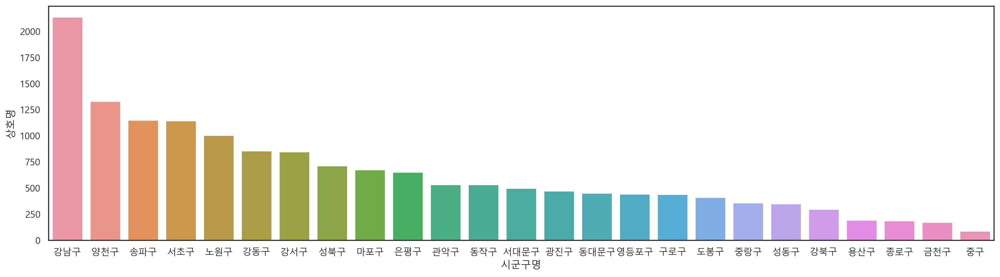

In [209]:
sns.barplot(x=result.index, y=result)
plt.show()

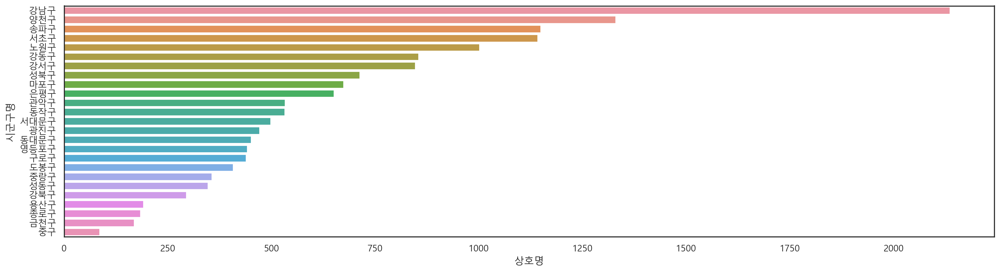

In [210]:
sns.barplot(x=result, y=result.index)
plt.show()

# 14. 서울시 데이터만 경도와 위도를 산점도로 시각화
## ① df_academy 데이터셋의 경도와 위도를 “시군명”별로 색상을 다르게 scatterplot으로 시각화


In [211]:
df_academy[['경도','위도']].isna().sum()

경도    0
위도    0
dtype: int64

In [215]:
sns.set(rc={'figure.figsize':(10,7)})
# 한글설정
plt.rc('font', family='Malgun Gothic') # 윈도우즈
plt.rc('axes', unicode_minus=False) # 축의 - 깨짐 방지

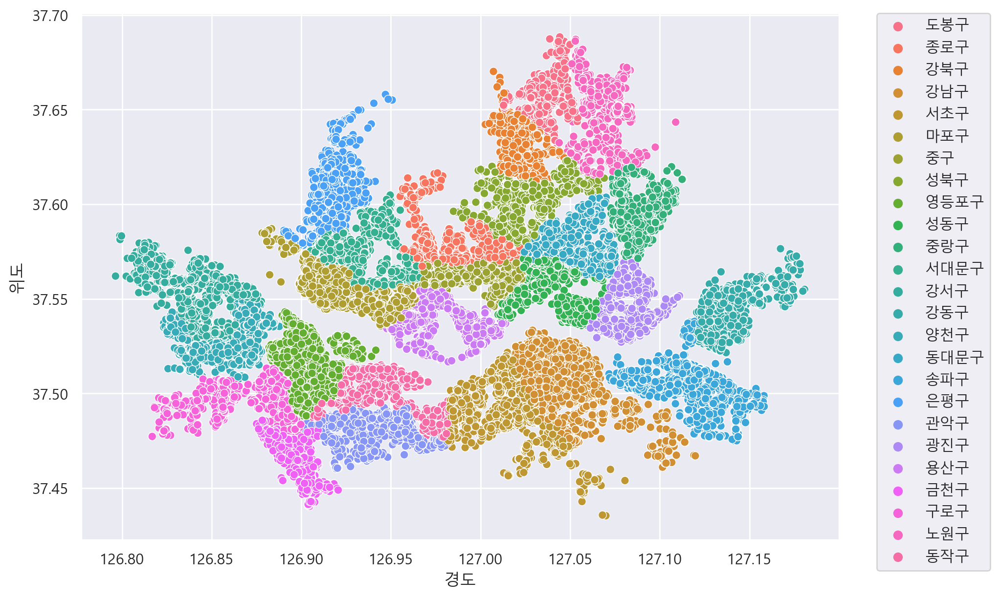

In [218]:
sns.scatterplot(data=df_academy,
               x='경도', y='위도', hue='시군구명')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [221]:
df_academy_sel.shape

(26787, 16)

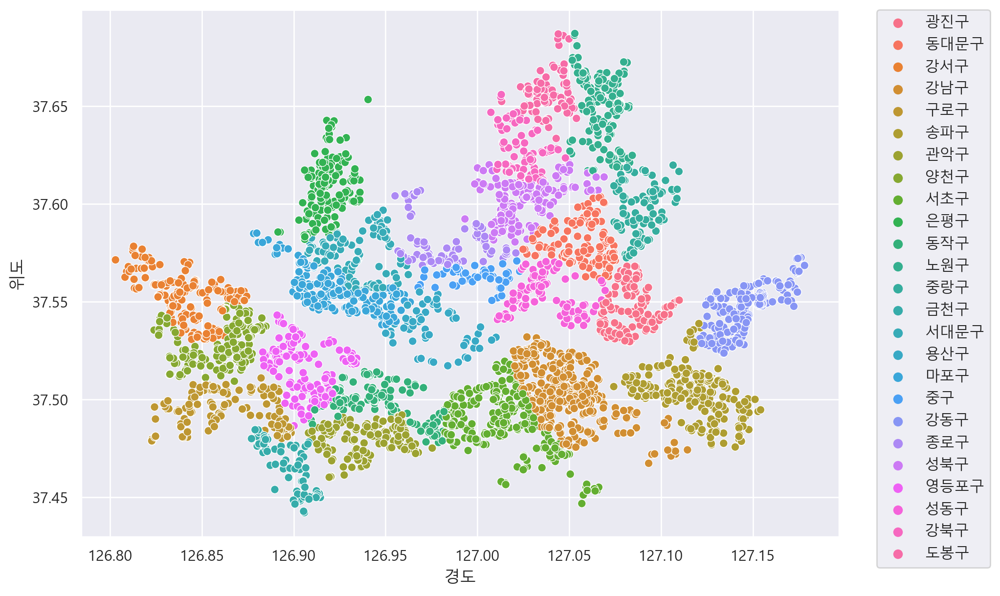

In [223]:
sns.scatterplot(data=df_academy_sel.sample(frac=0.2),
               x='경도', y='위도', hue='시군구명')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

## ② df_academy 데이터셋의 경도와 위도를 “상권업종소분류명”별로 색상을 다르게 scatterplot으로 시각화

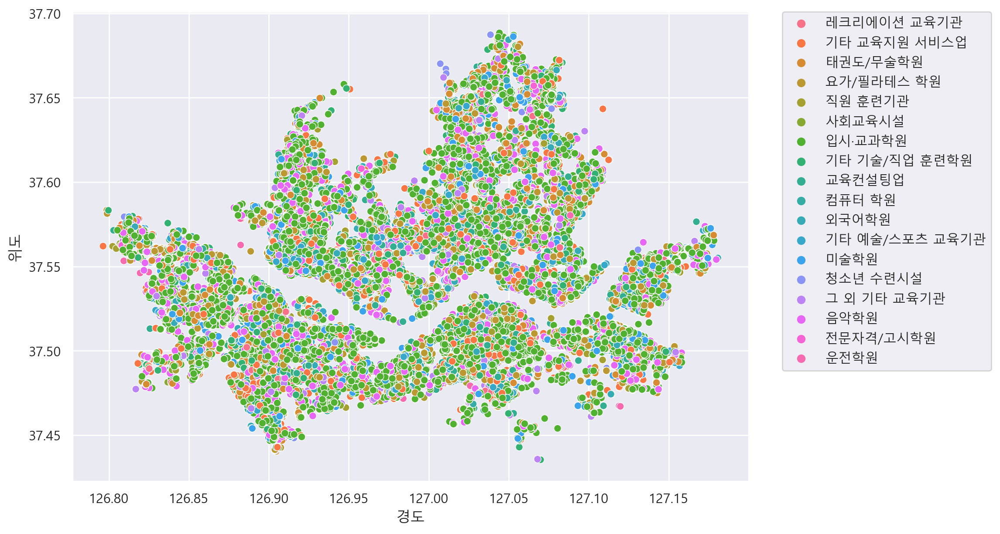

In [225]:
sns.scatterplot(data=df_academy,
               x='경도', y='위도', hue='상권업종소분류명')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [231]:
df_academy_sel.shape

(26787, 16)

In [232]:
df_academy_sel['상권업종소분류명'].unique()

array(['기타 교육지원 서비스업', '입시·교과학원', '교육컨설팅업', '미술학원', '음악학원'], dtype=object)

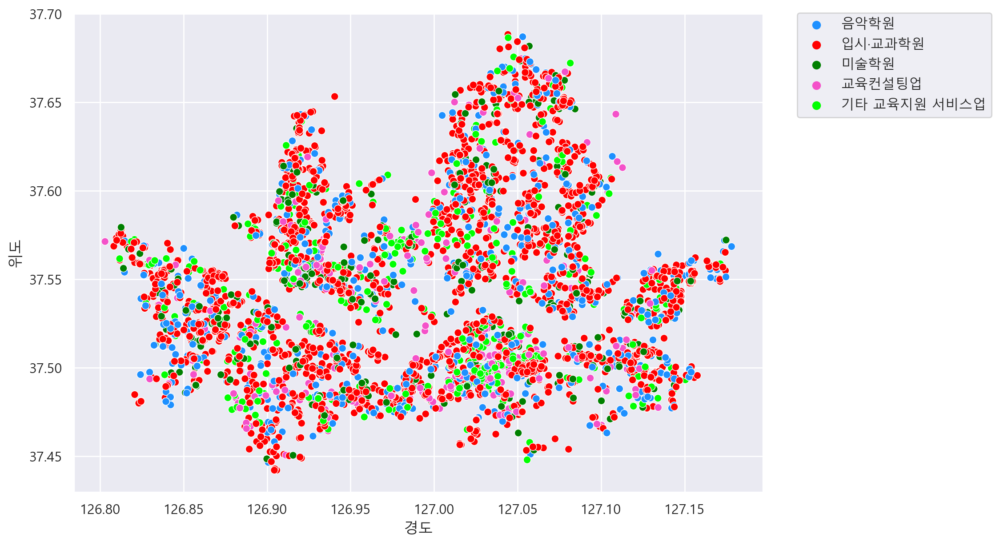

In [234]:
# df_academy_sel : 대치동 목동에 많은 입시관련 소분류들
custom_palette = {
    '입시·교과학원':'red',
    '기타 교육지원 서비스업':'#00ff00',
    '교육컨설팅업':'#f451c9',
    '미술학원':'green',
    '음악학원':'dodgerblue'
}
sns.scatterplot(data=df_academy_sel.sample(frac=0.2),
               x='경도', y='위도', hue='상권업종소분류명', palette=custom_palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

## ③ df_academy 데이터셋 중 “입시·교과학원” 데이터만, 경도와 위도를 “시군구명”별로 색상을 다르게 scatterplot으로 시각화

In [237]:
df_academy[df_academy['상권업종소분류명']=='입시·교과학원'].shape

(15901, 16)

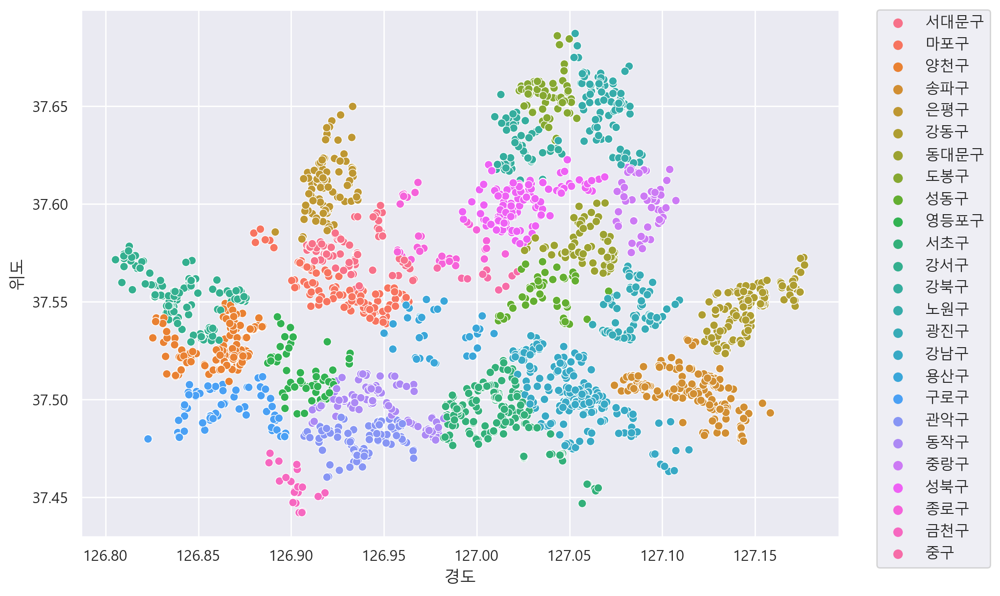

In [238]:
sns.scatterplot(data=df_academy[df_academy['상권업종소분류명']=='입시·교과학원'].sample(frac=0.2),
               x='경도', y='위도',
               hue='시군구명')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

## ④ df_academy 데이터셋 중 “태권도/무술학원” 데이터만, 경도와 위도를 “시군명”별로 색상을 다르게 scatterplot으로 시각화

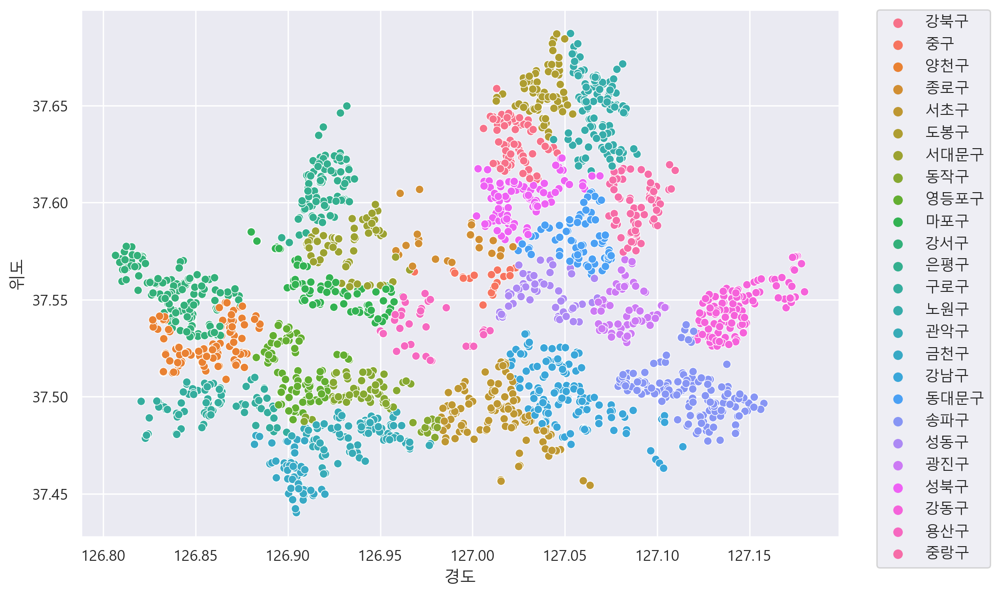

In [241]:
df_academy[df_academy['상권업종소분류명']=='태권도/무술학원']
sns.scatterplot(data=df_academy[df_academy['상권업종소분류명']=='태권도/무술학원'],
               x='경도', y='위도', hue='시군구명')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

## ⑤ df_academy 데이터셋 중 “입시·교과학원” 데이터와 “태권도/무술학원” 데이터만, 경도와 위도를 “상권업종소분류명”별로 색상을 다르게 scatterplot으로 시각화

In [244]:
df_f = df_academy[df_academy['상권업종소분류명'].isin(['입시·교과학원','태권도/무술학원'])]
df_f['상권업종소분류명'].value_counts()

입시·교과학원     15901
태권도/무술학원     2263
Name: 상권업종소분류명, dtype: int64

<Axes: xlabel='경도', ylabel='위도'>

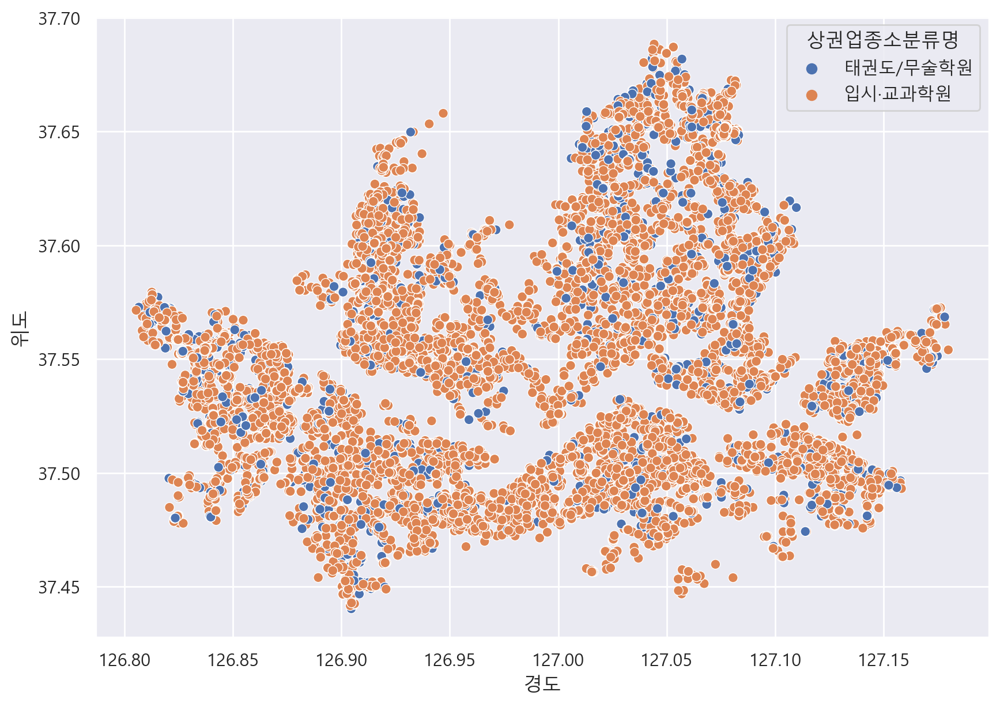

In [245]:
sns.scatterplot(data=df_f,
               x='경도', y='위도', hue='상권업종소분류명')

# 15.	지도 시각화 : Folium

아나콘다 프롬프트 pip install folium

-	docs : https://python-visualization.github.io/folium/latest/getting_started.html?utm_source=chatgpt.com
-	Quickstart : https://python-visualization.github.io/folium/version-v0.9.1/quickstart.html?utm_source=chatgpt.com


In [246]:
import folium
folium.__version__

'0.19.5'

In [249]:
df_f.loc[222, ['상호명','도로명','경도','위도']]

상호명             국선도수유수련원
도로명    서울특별시 강북구 인수봉로32길
경도            127.015192
위도             37.630723
Name: 222, dtype: object

In [281]:
'''
lat_mean = df_f['위도'].mean()
long_mean = df_f['경도'].mean()
# 지도 객체
m = folium.Map(location=(lat_mean, long_mean),
               width='90%', #width=800
               height='80%', #height=500
               zoom_start=11
              )
# 지도 객체에 마킹
lat = df_f.loc[222, '위도']
long = df_f.loc[222, '경도']
tooltip = '<b>{}-{}</b>'.format(df_f.loc[222, '상호명'], df_f.loc[222,'도로명'])
folium.Marker(
    location=[lat, long],
    tooltip=tooltip,
    #popup="Mt. Hood Meadows",
    icon=folium.Icon(icon="cloud"),
).add_to(m)
m
'''
print('지도 시각화가 용량이 많아서 문자로 처리하였습니다')

지도 시각화가 용량이 많아서 문자로 처리하였습니다


In [274]:
for i in df_f.index[:100]:
    print(i, end=' ')

222 1092 2617 3955 4563 4604 4680 4853 4944 4987 5101 5170 5196 5287 5994 6029 6292 6457 6746 10031 10259 11410 11981 12467 13852 14517 14836 15167 15617 15624 15737 15772 16044 16084 16180 16229 16270 16344 16494 17144 17145 17160 17203 17269 17307 17311 17382 17475 17500 18383 20656 20791 20802 20826 21032 21088 21345 21366 22991 23124 24222 24987 26177 26248 26314 26372 26423 26464 26541 27265 27958 29059 29983 30139 30622 30855 30882 30887 30971 31112 31150 31178 31240 31244 31277 31282 32441 32546 33788 33885 33948 35181 35745 35797 35907 36012 36015 36016 36030 36049 

In [279]:
'''
lat_mean = df_f['위도'].mean()
long_mean = df_f['경도'].mean()
# 지도 객체
m = folium.Map(location=(lat_mean, long_mean),
               width='90%', #width=800
               height='80%', #height=500
               zoom_start=11
              )
for i in df_f.index[:500]:
    # 지도 객체에 마킹
    lat = df_f.loc[i, '위도']
    long = df_f.loc[i, '경도']
    tooltip = '<b>{}-{}</b>'.format(df_f.loc[i, '상호명'], df_f.loc[i,'도로명'])
    folium.Marker(
        location=[lat, long],
        tooltip=tooltip,
        #popup="Mt. Hood Meadows",
        icon=folium.Icon(icon="cloud"),
    ).add_to(m)
m
'''

'\nlat_mean = df_f[\'위도\'].mean()\nlong_mean = df_f[\'경도\'].mean()\n# 지도 객체\nm = folium.Map(location=(lat_mean, long_mean),\n               width=\'90%\', #width=800\n               height=\'80%\', #height=500\n               zoom_start=11\n              )\nfor i in df_f.index[:500]:\n    # 지도 객체에 마킹\n    lat = df_f.loc[i, \'위도\']\n    long = df_f.loc[i, \'경도\']\n    tooltip = \'<b>{}-{}</b>\'.format(df_f.loc[i, \'상호명\'], df_f.loc[i,\'도로명\'])\n    folium.Marker(\n        location=[lat, long],\n        tooltip=tooltip,\n        #popup="Mt. Hood Meadows",\n        icon=folium.Icon(icon="cloud"),\n    ).add_to(m)\nm\n'

In [277]:
part = ['입시·교과학원','태권도/무술학원']
df1 = df_f[df_f['상권업종소분류명']=='태권도/무술학원']
df2 = df_f[df_f['상권업종소분류명']=='입시·교과학원']

In [280]:
'''
lat_mean = df_f['위도'].mean()
long_mean = df_f['경도'].mean()
# 지도 객체
m = folium.Map(location=(lat_mean, long_mean),
               width='90%', #width=800
               height='80%', #height=500
               zoom_start=11
              )
for i in df_f.index[:500]:
    # 지도 객체에 마킹
    lat = df_f.loc[i, '위도']
    long = df_f.loc[i, '경도']
    tooltip = '<b>{}-{}</b>'.format(df_f.loc[i, '상호명'], df_f.loc[i,'도로명'])
    folium.Marker(
        location=[lat, long],
        tooltip=tooltip,
        #popup="Mt. Hood Meadows",
        icon=folium.Icon(icon="cloud"),
    ).add_to(m)
m
'''

'\nlat_mean = df_f[\'위도\'].mean()\nlong_mean = df_f[\'경도\'].mean()\n# 지도 객체\nm = folium.Map(location=(lat_mean, long_mean),\n               width=\'90%\', #width=800\n               height=\'80%\', #height=500\n               zoom_start=11\n              )\nfor i in df_f.index[:500]:\n    # 지도 객체에 마킹\n    lat = df_f.loc[i, \'위도\']\n    long = df_f.loc[i, \'경도\']\n    tooltip = \'<b>{}-{}</b>\'.format(df_f.loc[i, \'상호명\'], df_f.loc[i,\'도로명\'])\n    folium.Marker(\n        location=[lat, long],\n        tooltip=tooltip,\n        #popup="Mt. Hood Meadows",\n        icon=folium.Icon(icon="cloud"),\n    ).add_to(m)\nm\n'